In [2]:
import tensorflow as tf
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score, classification_report, precision_score, recall_score
import numpy as np
import pandas as pd
from keras import layers, models
import os
import string
import pathlib
import cv2
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow_probability as tfp
tfd = tfp.distributions

- The following study, through which we can generate X-ray images of the chest region in a semi-conditional manner, by taking advantage of the probability distributions.
- The study relies on borrowing a probability distribution of the images included in the dataset, and making the generator generate the medical images in a manner commensurate with the probability distribution that the discerning trains on.
- Thus, the process operates unsupervised, with the aim of generating medical images with specific specifications. In the end, we try as much as possible to adjust the generation process according to that assumed probability distribution, and the basic way to control this is to work on choosing the probability distribution (continuous or discontinuous) so that it expresses a specific goal and assuming that probability distribution on the data contained in the dataset.
- As I mentioned, the study includes at the beginning making the discriminator trained to sort the data and images contained in the dataset into specific probability distributions, and then the generator is trained to carry out the generation process in accordance with that probability distribution.
- The study is based on the use of the tensorflow probabilistic library.
- The study does not work on studying whether specific samples belong to a probability distribution (normal, uniform, or Bernoulli,....) but it works to make the generator commit that the generation is appropriate for the samples that are taken from the probability distribution.
- The goal is to make the generator generate samples from chest x-ray images, taking into account the samples taken from the probability distributions.
The following study focuses on 4 cases that are adhered to during the obstetric process, and they are as follows:
- The use of the discontinuous Bernoulli distribution in order to predict whether the patient can live or not, and thus the Bernoulli distribution is appropriate for this case of diagnosis and the imposition of probability distributions.
- Using the continuous exponential distribution, with the aim of studying and determining the duration required to treat a patient infected with Coronavirus, or pneumonia. Thus, the generator is committed to generating samples for infected people who can be treated within a specified period. (The exponential distribution is suitable for studying a period of time to do a specific thing).
- Using the continuous regular distribution: with the aim of generating people with the same disease, but the disease is presented in a specific way (I think here that this case works to transfer the details of the disease from one lung to the other). That is, it helps in re-reviewing the same disease, but in a different way.
- Using a continuous regular distribution again: with the aim of extracting other features through which the disease can be presented.
- The basic idea, as mentioned above, is to assume a probabilistic distribution of the data contained in the dataset, and to study the belonging of the images included in the dataset to samples from that probability distribution.
- In the medical field, the use of a one-dimensional probability distribution is not capable of generating images with new features, because a specific change in one of the regions can lead to a complete change in the disease. That is not enough, so I moved to the use of multi-dimensional probability distributions (use 5 random variables for each probability distribution) in order to intertwine the basic features that each change and reshaping of the image can lead to according to specific samples.
- Finally, instead of using conditional entropy to compare whether the generated images are identical to the samples taken from the multivariate probability distributions, the mse loss function was used, by which the samples that the generator must adhere to during generation can be compared with the samples that the discriminator sorted through the generator.
- In order to ensure that the process and methodology used were successful, a structure for a convolutional neural network was proposed and many images were generated from the generator, and the convolutional neural network was trained on those images that were generated, and then the trained neural network was tested on the basic images included in the dataset, and got high results, and this indicates that the process is done correctly, and the semi-conditional generation operations were rather accurate.
- For training on other medical images, we need a large number of medical images, and we must know that the X-ray images are simple in terms of the information they provide compared to MRI and CT scans, which we can find difficult to generate conditionals for (since it is assumed that there are a large number of images included in the dataset).
- The multidimensional probability distributions used were not independent

# Using probability distributions (one-dimensional, multi-dimensional)

## One-dimensional probability distributions

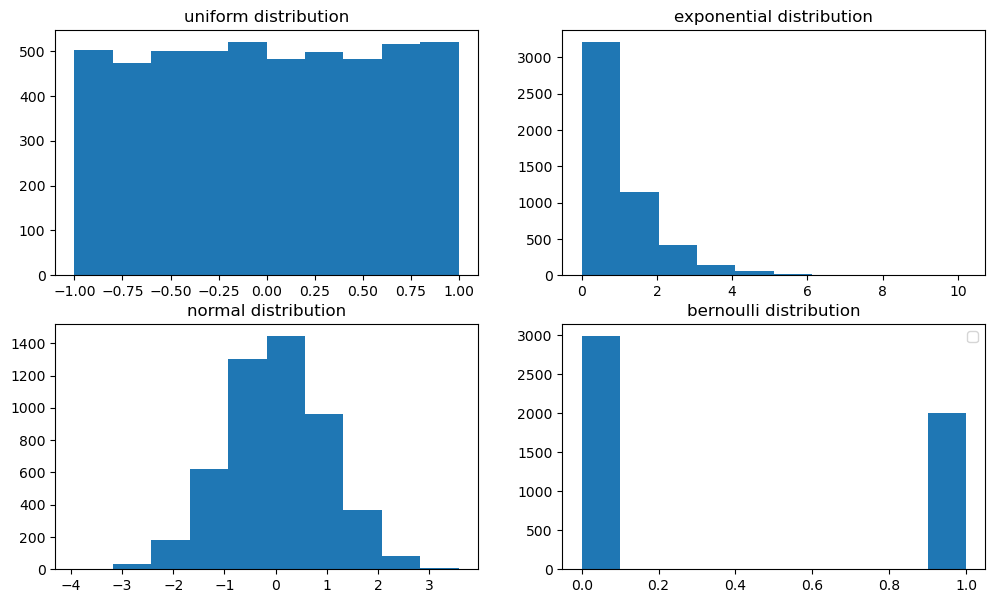

In [21]:
uniform = tfd.Uniform(low = -1, high = 1)
exponential = tfd.Exponential(rate = 1)
normal = tfd.Normal(loc = 0, scale = 1)
bernoulli = tfd.Bernoulli(probs = 0.4)
plt.figure(figsize = (12, 7))
data = [uniform.sample(5000), exponential.sample(5000), 
        normal.sample(5000), bernoulli.sample(5000)]
titles = ['uniform distribution', 'exponential distribution', 
          'normal distribution', 'bernoulli distribution']
for i in range(4):
    plt.subplot(2, 2, (i + 1))
    plt.title(titles[i])
    plt.hist(data[i])
plt.legend()

## Multidimensional probability distributions

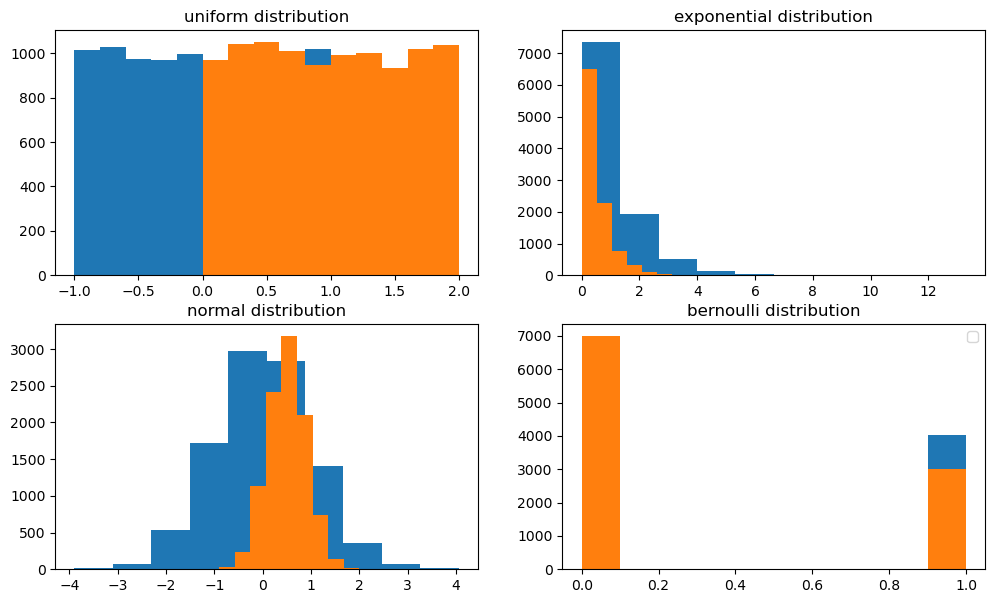

In [27]:
uniform = tfd.Uniform(low = [-1, 0], high = [1, 2])
exponential = tfd.Exponential(rate = [1, 2])
normal = tfd.Normal(loc = [0, 0.5], scale = [1, 0.4])
bernoulli = tfd.Bernoulli(probs = [0.4, 0.3])
plt.figure(figsize = (12, 7))
data = [uniform.sample(10000), exponential.sample(10000), 
        normal.sample(10000), bernoulli.sample(10000)]
titles = ['uniform distribution', 'exponential distribution', 
          'normal distribution', 'bernoulli distribution']
for i in range(4):
    plt.subplot(2, 2, (i + 1))
    plt.title(titles[i])
    plt.hist(data[i][:,0])
    plt.hist(data[i][:,1])
plt.legend()

# Read and review dataset images

In [3]:
class ReadDataset:
    def __init__(self, datasetpath, labels, image_shape):
        self.datasetpath = datasetpath
        self.labels = labels
        self.image_shape = image_shape
    def returListImages(self,):
        self.images = []
        for label in self.labels:
            self.images.append(list(pathlib.Path(os.path.join(self.datasetpath,
                                                              label)).glob('*.*')))
    def readImages(self,):
        self.returListImages()
        self.finalImages = []
        labels = []
        for label in range(len(self.labels)):
            for img in self.images[label][:1340]:
                img = cv2.imread(str(img), 0)
                img = cv2.resize(img , self.image_shape)
                img  = img/255
                self.finalImages.append(img)
                labels.append(label)
        images = np.array(self.finalImages)
        labels = np.array(labels)
        return images, labels

In [4]:
readDatasetObject = ReadDataset('/kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset',
                               ['COVID/images',
                                'Viral Pneumonia/images'],
                               (64, 64))
images, labels = readDatasetObject.readImages()
images.shape, labels.shape

((2680, 64, 64), (2680,))

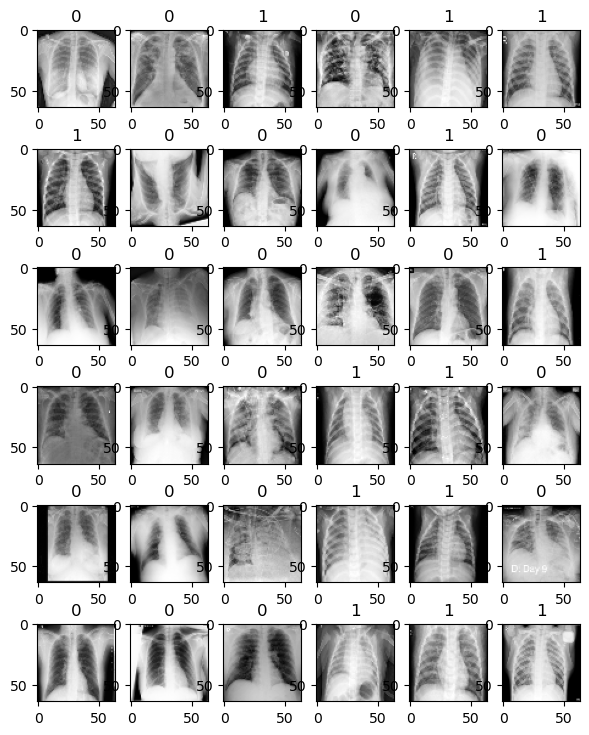

In [5]:
plt.figure(figsize = (7, 9))
indexs = np.random.randint(0, len(images), size = (36, ))
for i in range(36):
  plt.subplot(6, 6, (i + 1))
  plt.imshow(images[indexs][i], cmap = 'gray')
  plt.title(labels[indexs][i])
plt.legend()

In [5]:
labels = tf.keras.utils.to_categorical(labels,)
labels

array([[1., 0.],
       [1., 0.],
       [1., 0.],
       ...,
       [0., 1.],
       [0., 1.],
       [0., 1.]], dtype=float32)

# Generative neural network architecture:

In [6]:
epochs = 33000
batch = 32
eta = 0.0001
weight_decay = 0.0000000001
padding = 'same'
strides = 2
latent = 65
latent_con = 5
labelInput = 2

In [8]:
filters = [512, 256, 128, 64, 32]
ginput = layers.Input(shape = (latent, ))
labelsinput = layers.Input(shape = (labelInput, ))
# Multidimensional Bernoulli distribution
code_1_input = layers.Input(shape = (latent_con, ))
# Multivariate exponential distribution
code_2_input = layers.Input(shape = (latent_con, ))
# Multidimensional uniform distribution
code_3_input = layers.Input(shape = (latent_con, ))
# Multidimensional uniform distribution
code_4_input = layers.Input(shape = (latent_con, ))
x = layers.concatenate([ginput, labelsinput, code_1_input, code_2_input,
                       code_3_input, code_4_input])
x = layers.Dense(4*4*filters[0],
                 kernel_regularizer = tf.keras.regularizers.L2(0.001))(x)
x = layers.Reshape((4, 4, filters[0]))(x)
for filter in filters:
  if filter == 32:
    x = layers.Conv2DTranspose(filter, kernel_size = 3, padding = padding,
                               strides = 1)(x)
  else:
    x = layers.Conv2DTranspose(filter, kernel_size = 3, padding = padding,
                              strides = strides)(x)
    x = layers.LayerNormalization()(x)
    x = layers.Activation('relu')(x)
x = layers.Conv2DTranspose(1, kernel_size = 3, padding = padding, strides = 1)(x)
x = layers.Activation('sigmoid')(x)
generator = models.Model(
    inputs = [ginput, labelsinput, code_1_input, code_2_input,
             code_3_input, code_4_input],
    outputs = x
)
generator.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 65)]         0           []                               
                                                                                                  
 input_2 (InputLayer)           [(None, 2)]          0           []                               
                                                                                                  
 input_3 (InputLayer)           [(None, 5)]          0           []                               
                                                                                                  
 input_4 (InputLayer)           [(None, 5)]          0           []                               
                                                                                              

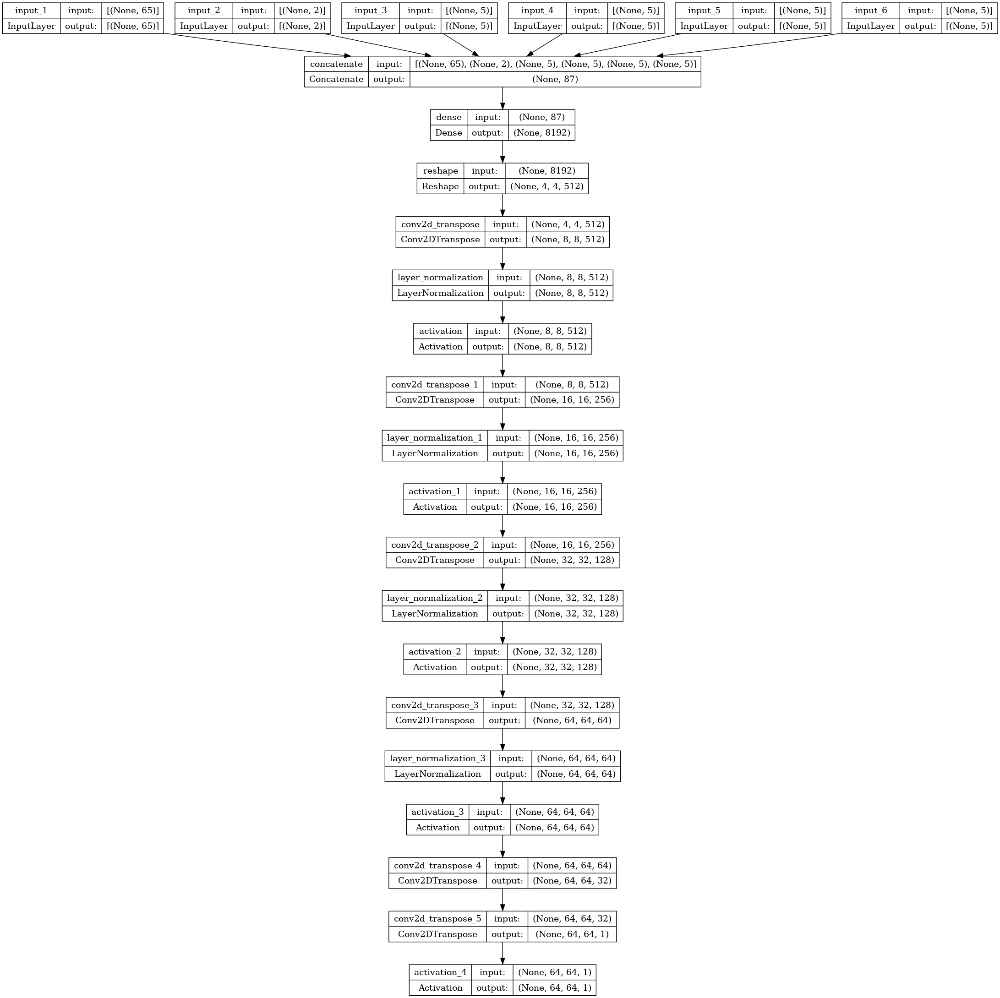

In [9]:
tf.keras.utils.plot_model(generator, show_shapes = True)

In [10]:
dinput = layers.Input(shape = (64, 64, 1))
filters = [64, 128, 256, 512]
x = dinput
for filter in filters[1:]:
  x = layers.Conv2D(filter, kernel_size = 5, padding = padding,
                    strides = strides)(x)
  x = layers.LeakyReLU(alpha = 0.2)(x)
x = layers.Conv2D(filters[-1], kernel_size = 5, padding = padding,
                  strides = 1)(x)
x = layers.LeakyReLU(alpha = 0.2)(x)
x = layers.Dropout(0.3)(x)
o = layers.Flatten()(x)
output1 = layers.Dense(1)(o)
layer = layers.Dense(128, kernel_regularizer = tf.keras.regularizers.L2(0.01))(o)
output2 = layers.Dense(64, activation = 'relu')(layer)
output2 = layers.BatchNormalization()(output2)
output2 = layers.Dense(32, activation = 'relu')(output2)
output2 = layers.BatchNormalization()(output2)
output2 = layers.Dense(labelInput, activation = 'softmax')(output2)
output3 = layers.Dense(latent_con,
                      kernel_regularizer = tf.keras.regularizers.L2(0.01),
                      activation = 'sigmoid')(layer)
output4 = layers.Dense(latent_con,
                      kernel_regularizer = tf.keras.regularizers.L2(0.01))(layer)
output5 = layers.Dense(latent_con,
                      kernel_regularizer = tf.keras.regularizers.L2(0.01),
                      activation = 'tanh')(layer)
output6 = layers.Dense(latent_con,
                      kernel_regularizer = tf.keras.regularizers.L2(0.01),
                      activation = 'tanh')(layer)
discriminator = models.Model(
    inputs = dinput,
    outputs = [output1, output2, output3, output4, output5, output6]
)
discriminator.compile(loss = ['mse', 'binary_crossentropy', 'binary_crossentropy',
                              'mse', 'mse', 'mse'],
                      optimizer = tf.keras.optimizers.RMSprop(
    learning_rate = eta,
    weight_decay = weight_decay
), loss_weights = [1, 1, 1, 0.7, 0.7, 0.7])
discriminator.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_7 (InputLayer)           [(None, 64, 64, 1)]  0           []                               
                                                                                                  
 conv2d (Conv2D)                (None, 32, 32, 128)  3328        ['input_7[0][0]']                
                                                                                                  
 leaky_re_lu (LeakyReLU)        (None, 32, 32, 128)  0           ['conv2d[0][0]']                 
                                                                                                  
 conv2d_1 (Conv2D)              (None, 16, 16, 256)  819456      ['leaky_re_lu[0][0]']            
                                                                                            

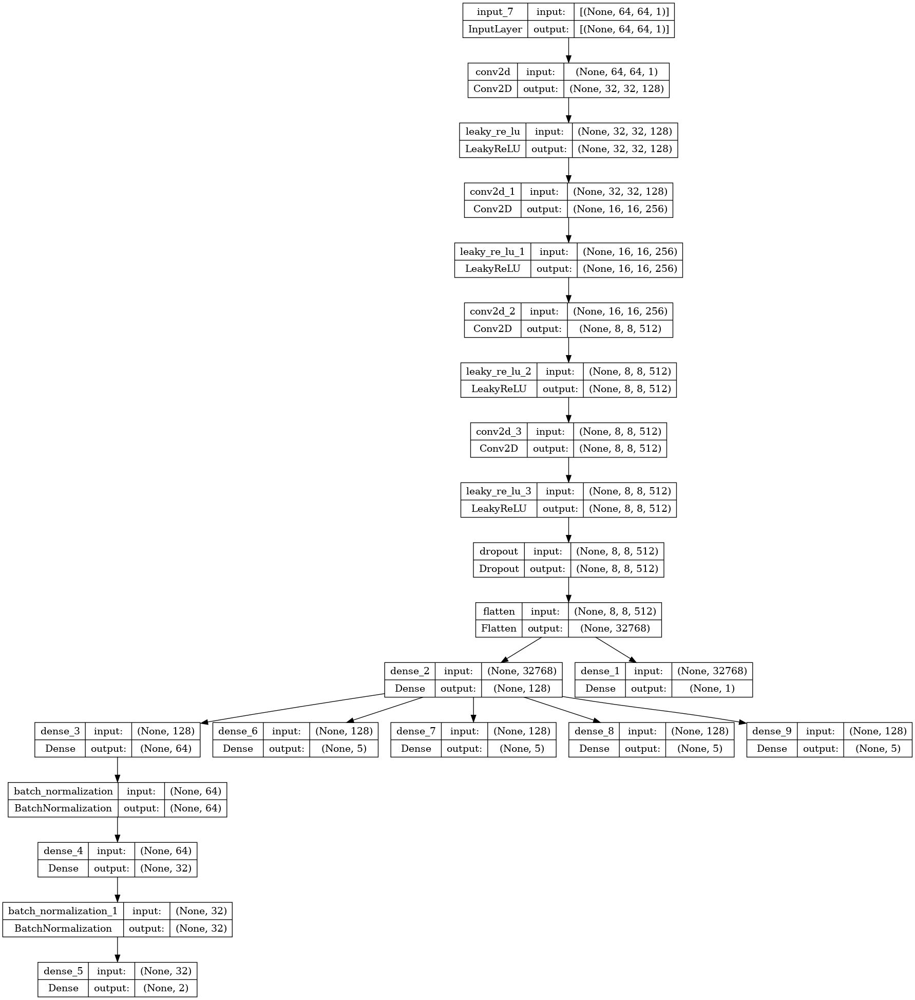

In [11]:
tf.keras.utils.plot_model(discriminator, show_shapes = True)

In [12]:
discriminator.trainable = False
gan = models.Model(
    inputs = [ginput, labelsinput, code_1_input, code_2_input,
             code_3_input, code_4_input],
    outputs = discriminator(generator([ginput, labelsinput, code_1_input, code_2_input,
             code_3_input, code_4_input]))
)
gan.compile(loss = ['mse', 'binary_crossentropy', 'binary_crossentropy',
                              'mse', 'mse', 'mse'],
            optimizer = tf.keras.optimizers.RMSprop(learning_rate = 0.5*eta,
                                                   weight_decay = weight_decay*0.5),
            loss_weights = [1, 1, 1, 0.7, 0.7, 0.7])
gan.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 65)]         0           []                               
                                                                                                  
 input_2 (InputLayer)           [(None, 2)]          0           []                               
                                                                                                  
 input_3 (InputLayer)           [(None, 5)]          0           []                               
                                                                                                  
 input_4 (InputLayer)           [(None, 5)]          0           []                               
                                                                                            

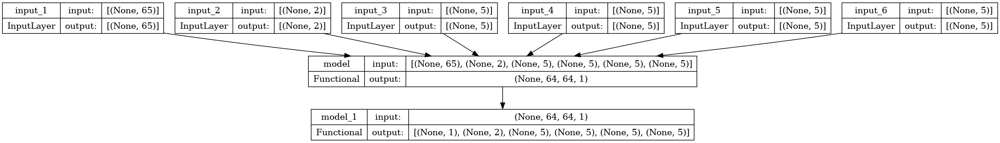

In [13]:
tf.keras.utils.plot_model(gan, show_shapes = True)

In [14]:
def show_sample(generator, batch, c1, c2, c3, c4):
  noise = tf.random.uniform(shape = (batch, latent), minval = -1, maxval = 1)
  fakeLabels = tf.keras.utils.to_categorical(
      np.random.choice(range(labelInput), size = (batch, )), num_classes = labelInput
  )
  images = tf.squeeze(generator.predict([noise, fakeLabels,
                                         c1.sample(batch),
                                         tf.zeros(shape = (batch, latent_con)),
                                         tf.zeros(shape = (batch, latent_con)),
                                         tf.zeros(shape = (batch, latent_con))], verbose = 0))
  images2 = tf.squeeze(generator.predict([noise, fakeLabels, 
                                          tf.zeros(shape = (batch, latent_con)),
                                          c2.sample(batch),
                                          tf.zeros(shape = (batch, latent_con)),
                                          tf.zeros(shape = (batch, latent_con))], verbose = 0))
  images3 = tf.squeeze(generator.predict([noise, fakeLabels, 
                                          tf.zeros(shape = (batch, latent_con)),
                                          tf.zeros(shape = (batch, latent_con)),
                                          c3.sample(batch),
                                          tf.zeros(shape = (batch, latent_con))], verbose = 0))
  images4 = tf.squeeze(generator.predict([noise, fakeLabels, 
                                          tf.zeros(shape = (batch, latent_con)),
                                          tf.zeros(shape = (batch, latent_con)),
                                          tf.zeros(shape = (batch, latent_con)),
                                          c4.sample(batch)], verbose = 0))
  allimages = np.vstack([images, images2, images3, images4])
  labels = np.vstack([fakeLabels, fakeLabels, fakeLabels, fakeLabels])
  labels = np.argmax(labels, axis = 1)
  plt.figure(figsize = (12, 5))
  for i in range(32):
    plt.subplot(4, 8, (i + 1))
    plt.imshow(allimages[i], cmap = 'gray')
    plt.title(labels[i])
  plt.show()

In [9]:
c1 = tfd.Bernoulli(probs = [0.5, 0.4, 0.5, 0.5, 0.4])
c2 = tfd.Exponential(rate = tf.ones(shape = (latent_con, )))
c3 = tfd.Uniform(low = tf.ones(shape = (latent_con, ))*-1, 
                high = tf.ones(shape = (latent_con, )))

2023-07-24 08:08:49.011679: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel_1/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer
2023-07-24 08:08:56.533541: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel_2/model_1/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


epoch: 0
discriminator: allloss 6.855107307434082, tagloss 0.4856705963611603, labelloss 0.9627609252929688, code_1_loss 0.6952301263809204, code_2_loss 1.8783271312713623, code_3_loss 0.31686532497406006, code_4_loss 0.35215047001838684
generator: allloss 6.860653877258301, tagloss 0.6997718811035156, labelloss 0.6809630393981934, code_1_loss 0.6898849606513977, code_2_loss 1.7985193729400635, code_3_loss 0.3195733428001404, code_4_loss 0.303985595703125


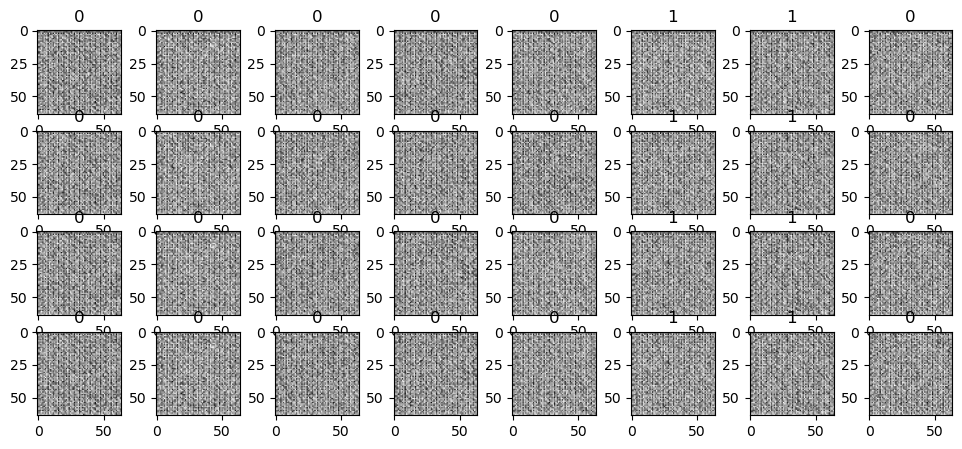

epoch: 1000
discriminator: allloss 1.8428895473480225, tagloss 0.14277470111846924, labelloss 0.010072538629174232, code_1_loss 0.5178731083869934, code_2_loss 0.7051697373390198, code_3_loss 0.2624805271625519, code_4_loss 0.2436978816986084
generator: allloss 1.274308681488037, tagloss 0.30533450841903687, labelloss 0.0022231985349208117, code_1_loss 0.2961203157901764, code_2_loss 0.12463875114917755, code_3_loss 0.08499179780483246, code_4_loss 0.07281874865293503


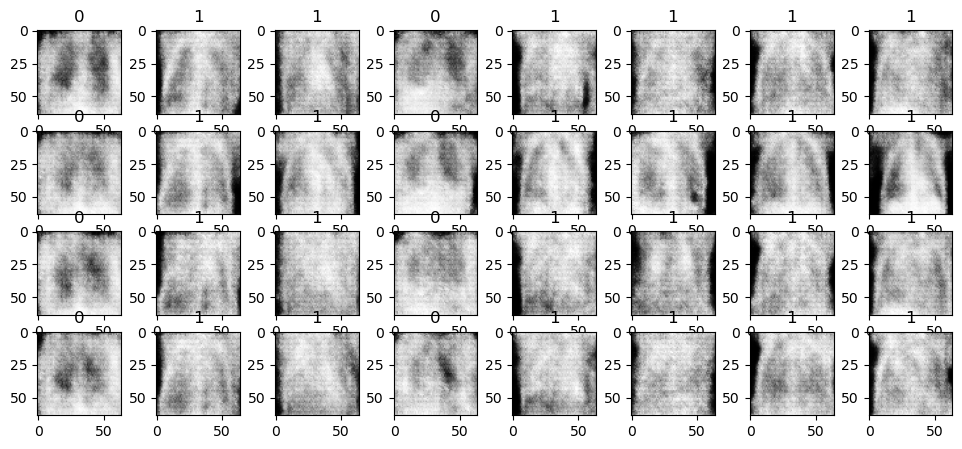

epoch: 2000
discriminator: allloss 1.5775302648544312, tagloss 0.14173853397369385, labelloss 0.0014176240656524897, code_1_loss 0.4880274534225464, code_2_loss 0.5891048312187195, code_3_loss 0.2130274772644043, code_4_loss 0.20643065869808197
generator: allloss 1.3800973892211914, tagloss 0.5112941265106201, labelloss 0.000919693848118186, code_1_loss 0.2881191372871399, code_2_loss 0.1243647038936615, code_3_loss 0.07849365472793579, code_4_loss 0.08350947499275208


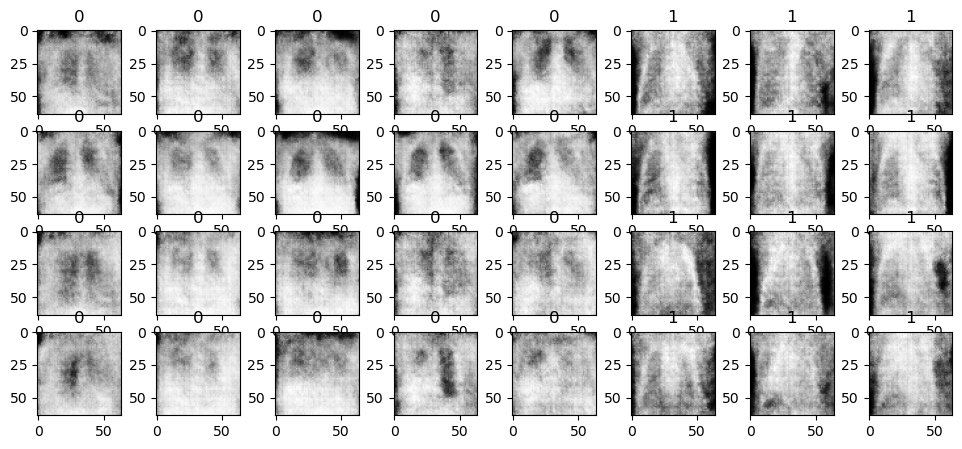

epoch: 3000
discriminator: allloss 1.6144638061523438, tagloss 0.09224067628383636, labelloss 0.01794939488172531, code_1_loss 0.48507577180862427, code_2_loss 0.6705005764961243, code_3_loss 0.23942077159881592, code_4_loss 0.25278258323669434
generator: allloss 1.5879652500152588, tagloss 0.8284865617752075, labelloss 0.0006642155931331217, code_1_loss 0.2311885803937912, code_2_loss 0.1250302493572235, code_3_loss 0.07450710982084274, code_4_loss 0.07360011339187622


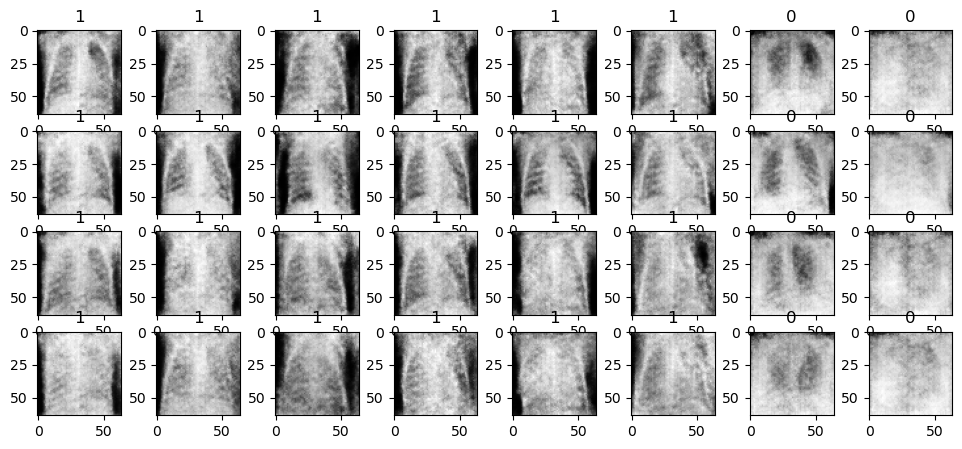

epoch: 4000
discriminator: allloss 1.5140026807785034, tagloss 0.11843457818031311, labelloss 0.0034802837762981653, code_1_loss 0.5069903135299683, code_2_loss 0.5692799687385559, code_3_loss 0.21179446578025818, code_4_loss 0.21923190355300903
generator: allloss 1.2910633087158203, tagloss 0.4617757499217987, labelloss 0.00030265835812315345, code_1_loss 0.2569696009159088, code_2_loss 0.16020478308200836, code_3_loss 0.11001767963171005, code_4_loss 0.10485410690307617


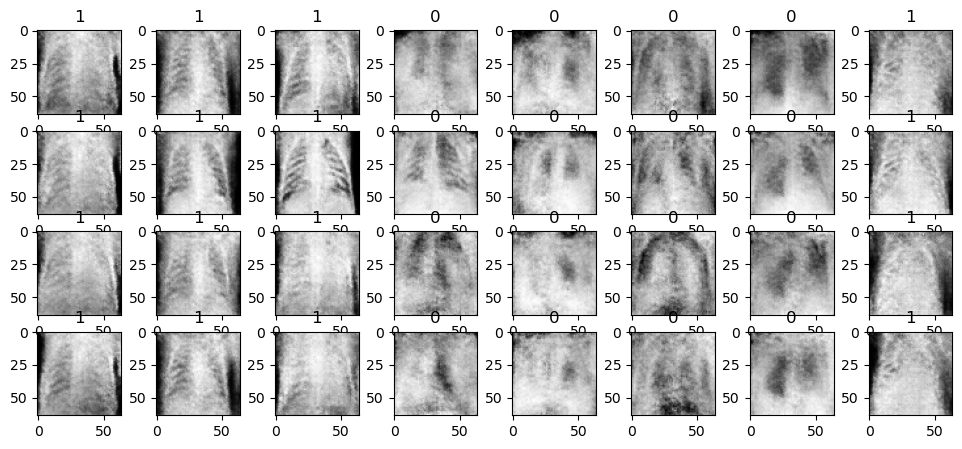

epoch: 5000
discriminator: allloss 1.4629645347595215, tagloss 0.09783577919006348, labelloss 0.0012537920847535133, code_1_loss 0.4961671829223633, code_2_loss 0.5134438276290894, code_3_loss 0.23465599119663239, code_4_loss 0.24577613174915314
generator: allloss 1.4360322952270508, tagloss 0.6805981993675232, labelloss 0.000887201982550323, code_1_loss 0.24218758940696716, code_2_loss 0.1344279646873474, code_3_loss 0.09444136917591095, code_4_loss 0.085322305560112


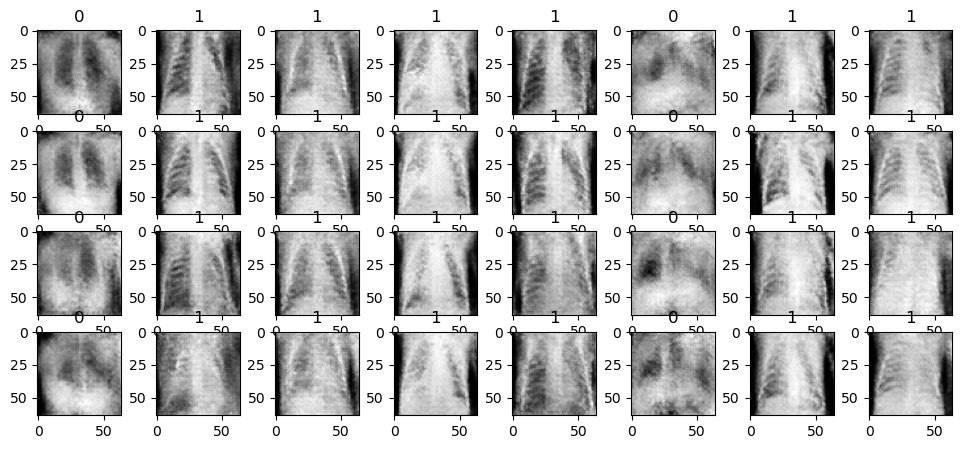

epoch: 6000
discriminator: allloss 1.5562273263931274, tagloss 0.1890505999326706, labelloss 0.0012539987219497561, code_1_loss 0.5016263723373413, code_2_loss 0.5005677938461304, code_3_loss 0.2550611197948456, code_4_loss 0.24472032487392426
generator: allloss 1.146803855895996, tagloss 0.45242103934288025, labelloss 0.0035863430239260197, code_1_loss 0.23453006148338318, code_2_loss 0.08577011525630951, code_3_loss 0.08458627760410309, code_4_loss 0.08052060753107071


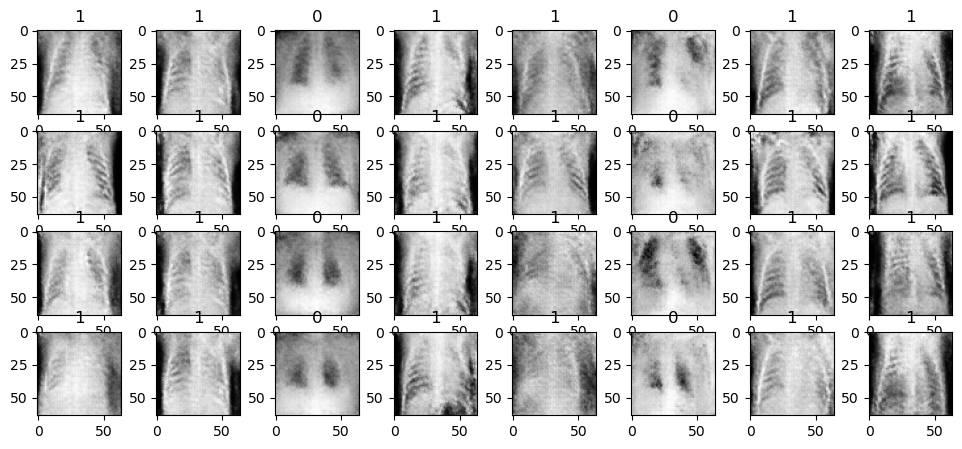

epoch: 7000
discriminator: allloss 1.467936635017395, tagloss 0.12483737617731094, labelloss 0.0011374657042324543, code_1_loss 0.5231376886367798, code_2_loss 0.44309431314468384, code_3_loss 0.22893187403678894, code_4_loss 0.27038082480430603
generator: allloss 1.1544482707977295, tagloss 0.4629085958003998, labelloss 5.52927449462004e-05, code_1_loss 0.21923582255840302, code_2_loss 0.09067258983850479, code_3_loss 0.09710721671581268, code_4_loss 0.0972302258014679


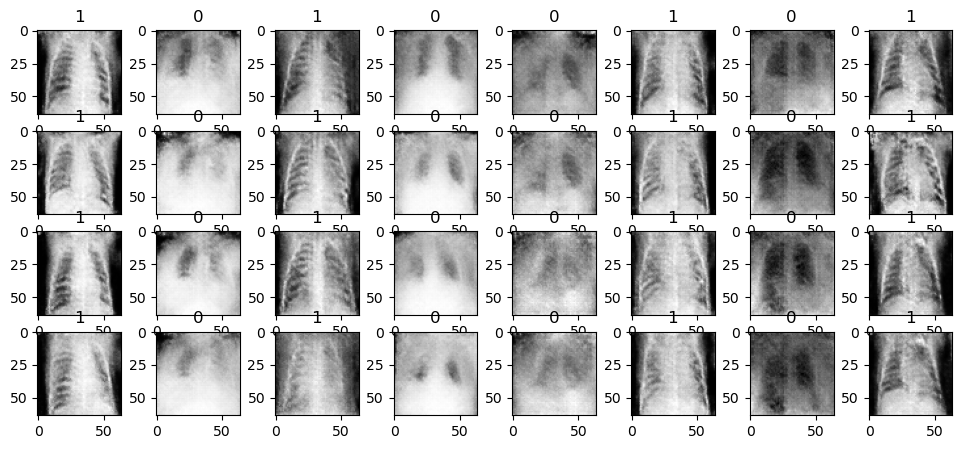

epoch: 8000
discriminator: allloss 1.527329683303833, tagloss 0.11371750384569168, labelloss 0.0006197656039148569, code_1_loss 0.4953916072845459, code_2_loss 0.6055193543434143, code_3_loss 0.22674959897994995, code_4_loss 0.2539401352405548
generator: allloss 1.6554090976715088, tagloss 0.9457208514213562, labelloss 6.18634294369258e-05, code_1_loss 0.23383621871471405, code_2_loss 0.11638015508651733, code_3_loss 0.10215816646814346, code_4_loss 0.07856540381908417


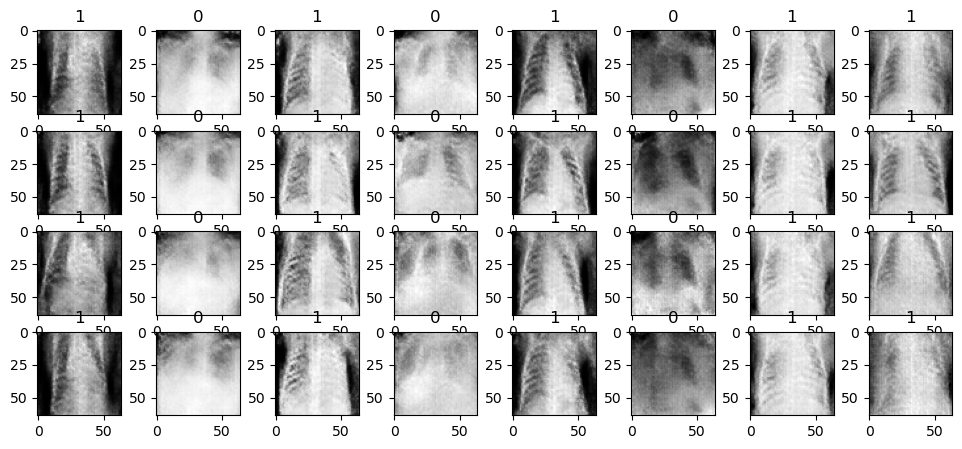

epoch: 9000
discriminator: allloss 1.5090978145599365, tagloss 0.10128806531429291, labelloss 0.00010889585973927751, code_1_loss 0.495097279548645, code_2_loss 0.5936477780342102, code_3_loss 0.24012047052383423, code_4_loss 0.24992015957832336
generator: allloss 1.361052393913269, tagloss 0.6365624666213989, labelloss 0.00014221234596334398, code_1_loss 0.23770031332969666, code_2_loss 0.1361197531223297, code_3_loss 0.09856805950403214, code_4_loss 0.08579862117767334


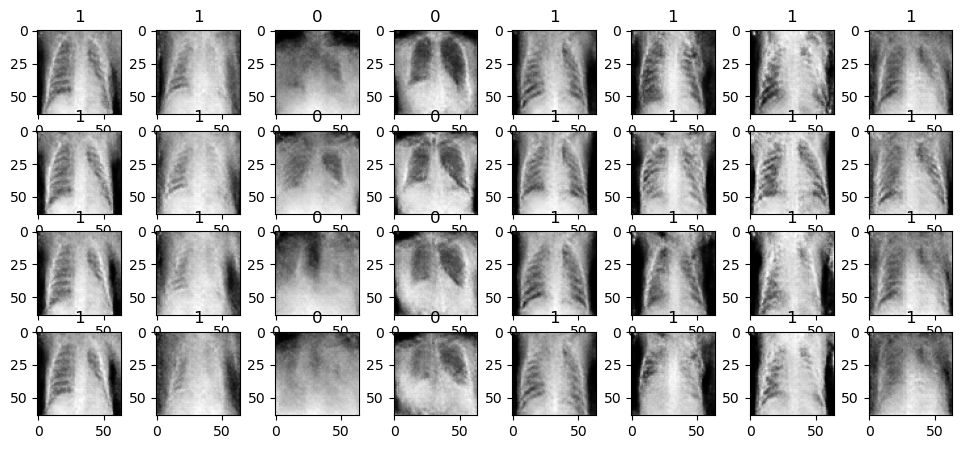

epoch: 10000
discriminator: allloss 1.580078363418579, tagloss 0.11421889811754227, labelloss 4.2301631765440106e-05, code_1_loss 0.49589577317237854, code_2_loss 0.7117813229560852, code_3_loss 0.21884766221046448, code_4_loss 0.2411511391401291
generator: allloss 1.3594688177108765, tagloss 0.679663896560669, labelloss 1.6387948562623933e-05, code_1_loss 0.21102546155452728, code_2_loss 0.133579820394516, code_3_loss 0.07921990752220154, code_4_loss 0.09085264801979065


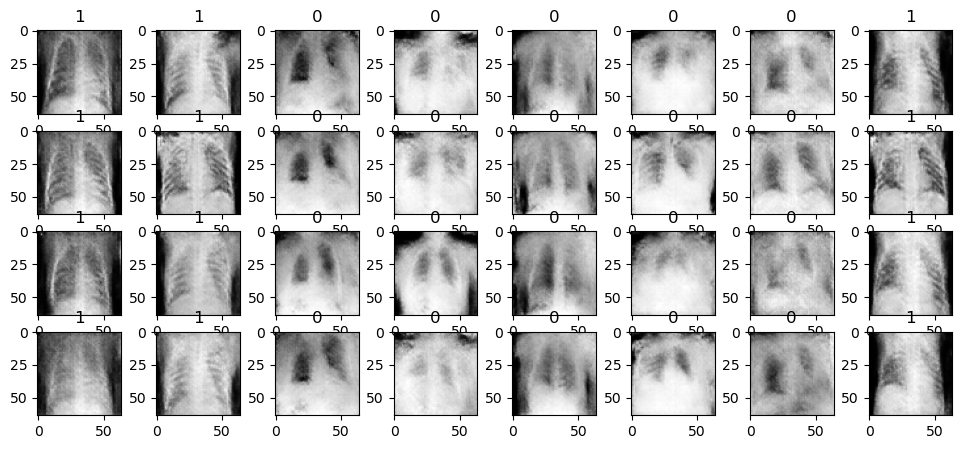

epoch: 11000
discriminator: allloss 1.407433271408081, tagloss 0.08383497595787048, labelloss 2.9319595341803506e-05, code_1_loss 0.4749521315097809, code_2_loss 0.500188946723938, code_3_loss 0.24522869288921356, code_4_loss 0.2550660967826843
generator: allloss 1.555983066558838, tagloss 0.842190146446228, labelloss 2.2007021470926702e-05, code_1_loss 0.24377834796905518, code_2_loss 0.11370279639959335, code_3_loss 0.09349711984395981, code_4_loss 0.10311166942119598


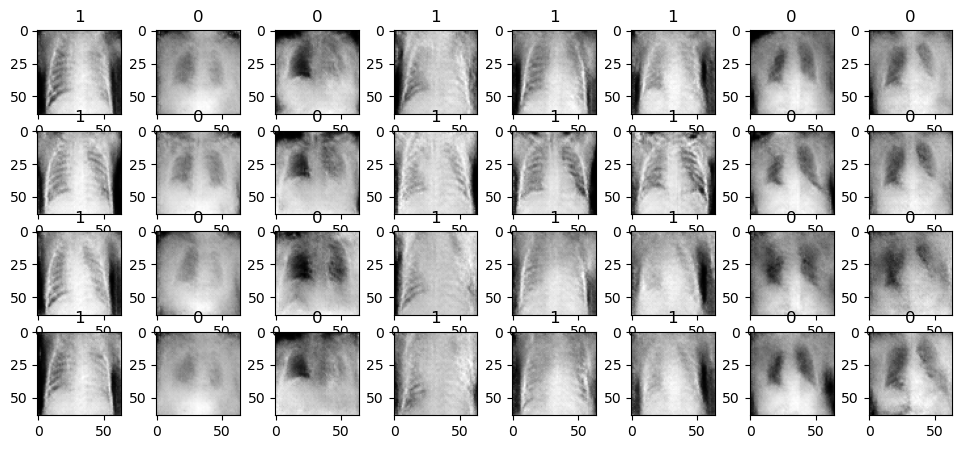

epoch: 12000
discriminator: allloss 1.5267325639724731, tagloss 0.1170201376080513, labelloss 0.00026467227144166827, code_1_loss 0.4664894938468933, code_2_loss 0.648882269859314, code_3_loss 0.23329660296440125, code_4_loss 0.2521880865097046
generator: allloss 1.0654425621032715, tagloss 0.3894769251346588, labelloss 2.5665052817203104e-05, code_1_loss 0.212747722864151, code_2_loss 0.11918386816978455, code_3_loss 0.09150958806276321, code_4_loss 0.09094727039337158


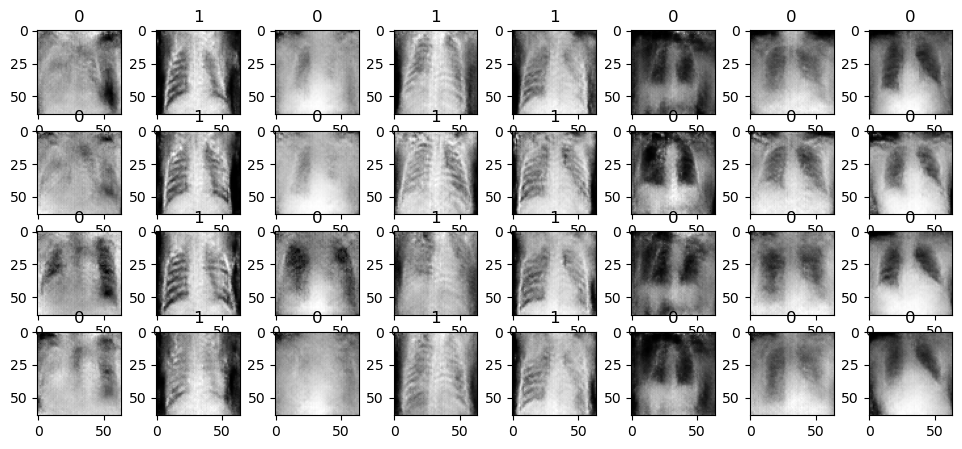

epoch: 13000
discriminator: allloss 1.418900489807129, tagloss 0.09675557911396027, labelloss 0.006727762520313263, code_1_loss 0.47071903944015503, code_2_loss 0.5278384685516357, code_3_loss 0.23699922859668732, code_4_loss 0.22735092043876648
generator: allloss 2.099489450454712, tagloss 1.4481884241104126, labelloss 0.000839247542899102, code_1_loss 0.20625682175159454, code_2_loss 0.10218538343906403, code_3_loss 0.09244543313980103, code_4_loss 0.08018471300601959


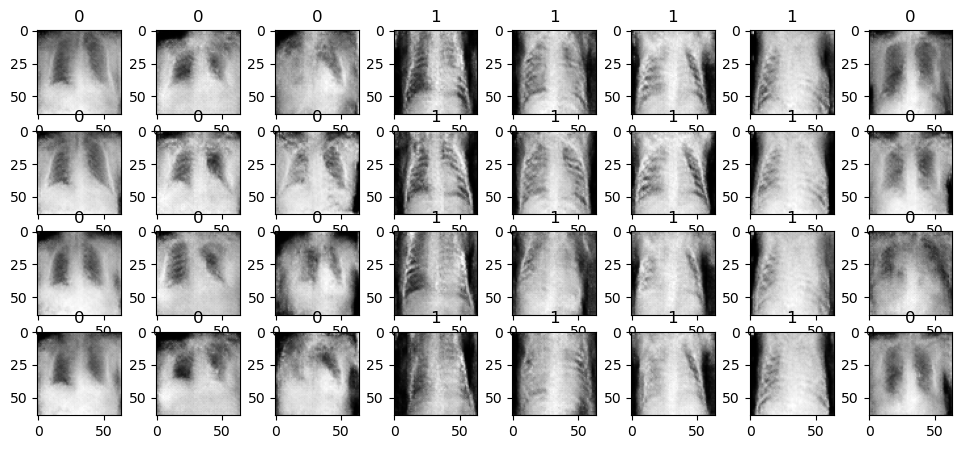

epoch: 14000
discriminator: allloss 1.4336013793945312, tagloss 0.07709014415740967, labelloss 0.00010342199675505981, code_1_loss 0.49022799730300903, code_2_loss 0.5349917411804199, code_3_loss 0.26581549644470215, code_4_loss 0.22467562556266785
generator: allloss 1.5423998832702637, tagloss 0.9166444540023804, labelloss 0.0005116650718264282, code_1_loss 0.18872874975204468, code_2_loss 0.09868215024471283, code_3_loss 0.0804300308227539, code_4_loss 0.08944599330425262


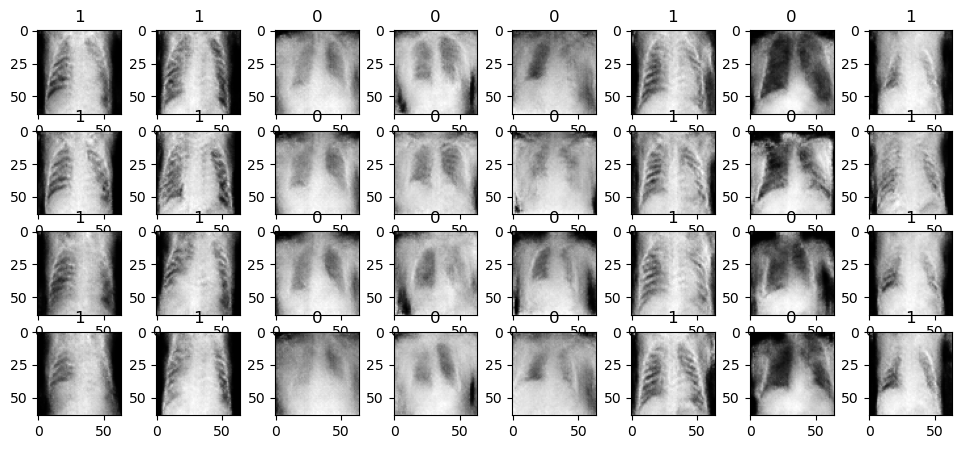

epoch: 15000
discriminator: allloss 1.3134723901748657, tagloss 0.060653164982795715, labelloss 0.0015443668235093355, code_1_loss 0.4642508625984192, code_2_loss 0.4841114282608032, code_3_loss 0.22186896204948425, code_4_loss 0.2084220051765442
generator: allloss 1.5463100671768188, tagloss 0.9187237024307251, labelloss 9.525270797894336e-06, code_1_loss 0.1853693574666977, code_2_loss 0.10043931007385254, code_3_loss 0.08485742658376694, code_4_loss 0.09491705894470215


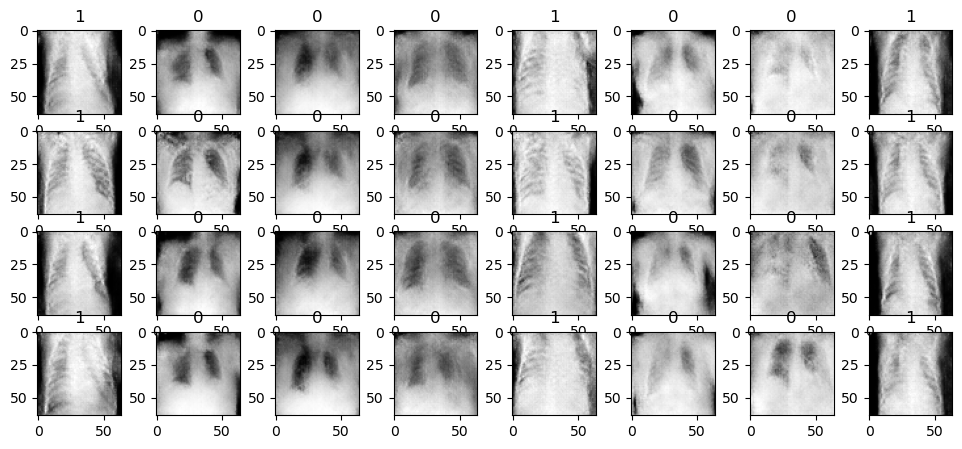

epoch: 16000
discriminator: allloss 1.3915913105010986, tagloss 0.0946444720029831, labelloss 3.0299774152808823e-05, code_1_loss 0.45184561610221863, code_2_loss 0.5764508247375488, code_3_loss 0.1932028830051422, code_4_loss 0.23088353872299194
generator: allloss 1.2468318939208984, tagloss 0.5688298940658569, labelloss 6.732231850037351e-05, code_1_loss 0.20151430368423462, code_2_loss 0.16991117596626282, code_3_loss 0.07655252516269684, code_4_loss 0.08732277899980545


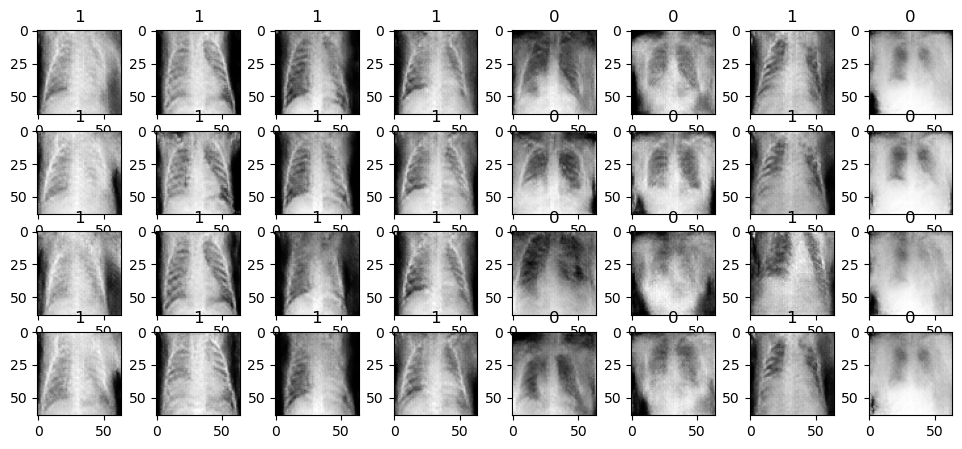

epoch: 17000
discriminator: allloss 1.3431793451309204, tagloss 0.0748804360628128, labelloss 0.001398741384036839, code_1_loss 0.45302873849868774, code_2_loss 0.5674934387207031, code_3_loss 0.18195059895515442, code_4_loss 0.20435789227485657
generator: allloss 1.6717820167541504, tagloss 1.0779623985290527, labelloss 3.30684742948506e-05, code_1_loss 0.17749536037445068, code_2_loss 0.09315074980258942, code_3_loss 0.07486150413751602, code_4_loss 0.07928763329982758


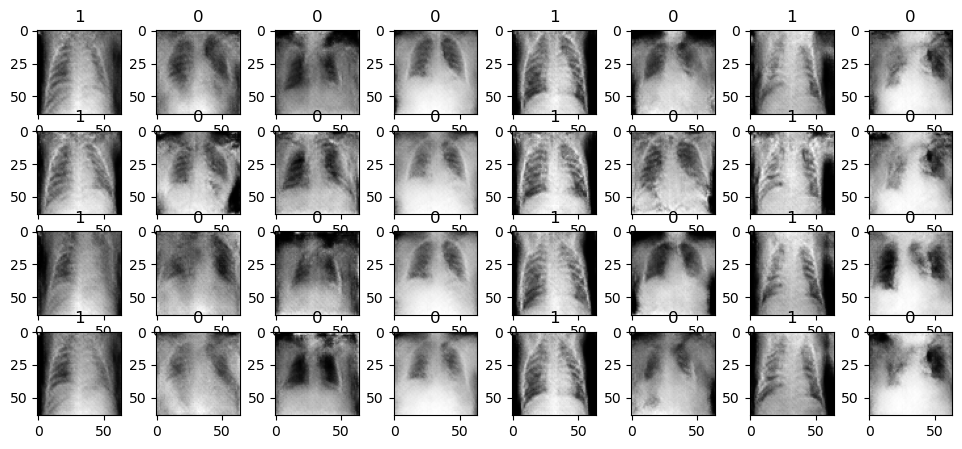

epoch: 18000
discriminator: allloss 1.4121973514556885, tagloss 0.06694263964891434, labelloss 1.4600043868995272e-05, code_1_loss 0.4380490183830261, code_2_loss 0.6399754285812378, code_3_loss 0.22521474957466125, code_4_loss 0.22041504085063934
generator: allloss 1.328373908996582, tagloss 0.7258068919181824, labelloss 2.2583586542168632e-05, code_1_loss 0.16447797417640686, code_2_loss 0.13318338990211487, code_3_loss 0.07864226400852203, code_4_loss 0.06647878140211105


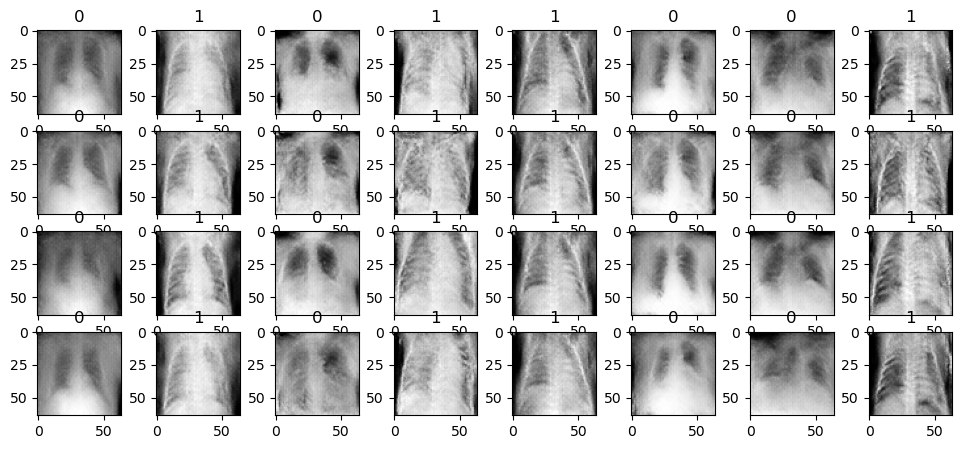

epoch: 19000
discriminator: allloss 1.4200615882873535, tagloss 0.11000022292137146, labelloss 3.5912045859731734e-05, code_1_loss 0.45722702145576477, code_2_loss 0.5356467366218567, code_3_loss 0.23000755906105042, code_4_loss 0.25111037492752075
generator: allloss 0.9876638650894165, tagloss 0.42189234495162964, labelloss 9.944035809894558e-06, code_1_loss 0.15968695282936096, code_2_loss 0.09279040992259979, code_3_loss 0.0772237628698349, code_4_loss 0.07263761758804321


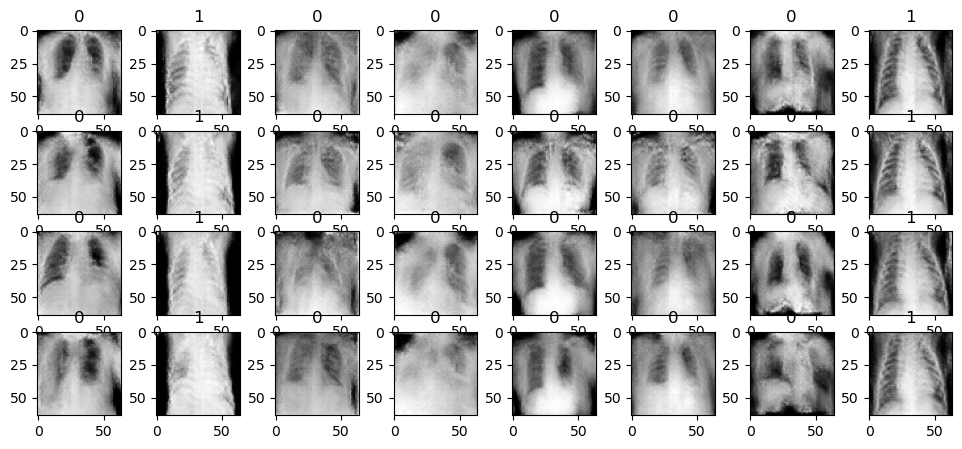

epoch: 20000
discriminator: allloss 1.2355788946151733, tagloss 0.04759574308991432, labelloss 0.00015938251453917474, code_1_loss 0.43550002574920654, code_2_loss 0.4363594055175781, code_3_loss 0.23277032375335693, code_4_loss 0.20499944686889648
generator: allloss 1.504547357559204, tagloss 0.9966528415679932, labelloss 4.993473794456804e-06, code_1_loss 0.14706429839134216, code_2_loss 0.06532898545265198, code_3_loss 0.04880288988351822, code_4_loss 0.06601986289024353


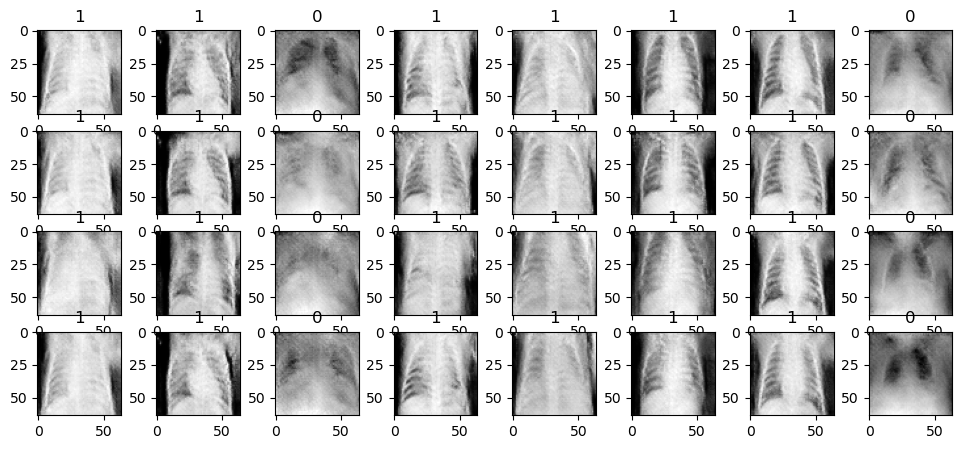

epoch: 21000
discriminator: allloss 1.308361291885376, tagloss 0.0839703381061554, labelloss 1.3134864275343716e-05, code_1_loss 0.4454055428504944, code_2_loss 0.4618811011314392, code_3_loss 0.23569239675998688, code_4_loss 0.21453717350959778
generator: allloss 2.1425821781158447, tagloss 1.6000934839248657, labelloss 5.4312658903654665e-06, code_1_loss 0.1442679464817047, code_2_loss 0.0936644971370697, code_3_loss 0.06826599687337875, code_4_loss 0.0726744681596756


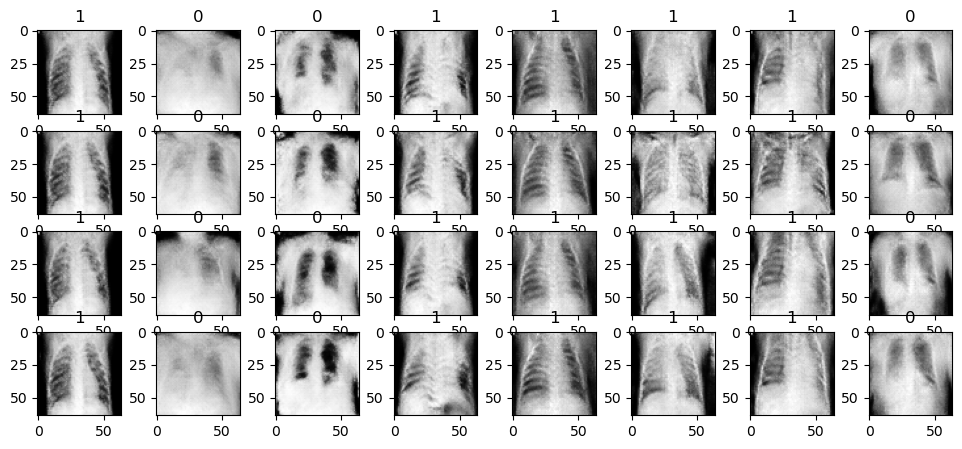

epoch: 22000
discriminator: allloss 1.3617284297943115, tagloss 0.07109174132347107, labelloss 0.004019764252007008, code_1_loss 0.46980682015419006, code_2_loss 0.5675811171531677, code_3_loss 0.18850906193256378, code_4_loss 0.20728319883346558
generator: allloss 1.2536319494247437, tagloss 0.6965189576148987, labelloss 2.517788379918784e-05, code_1_loss 0.1560252606868744, code_2_loss 0.09577973932027817, code_3_loss 0.06547814607620239, code_4_loss 0.07564243674278259


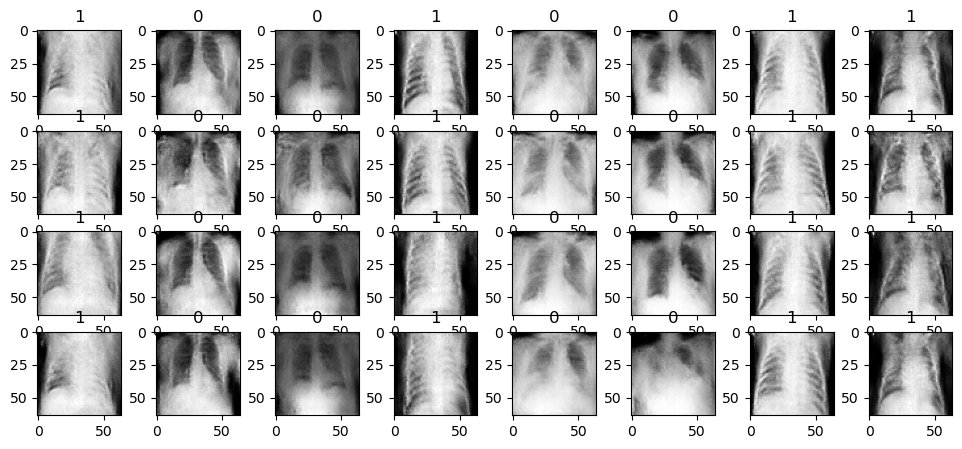

epoch: 23000
discriminator: allloss 1.5787053108215332, tagloss 0.07024743407964706, labelloss 1.162248918262776e-05, code_1_loss 0.467794805765152, code_2_loss 0.8585483431816101, code_3_loss 0.22162136435508728, code_4_loss 0.20668217539787292
generator: allloss 1.2683161497116089, tagloss 0.7374531030654907, labelloss 4.821723905479303e-06, code_1_loss 0.14534462988376617, code_2_loss 0.09166935086250305, code_3_loss 0.06258029490709305, code_4_loss 0.06538920104503632


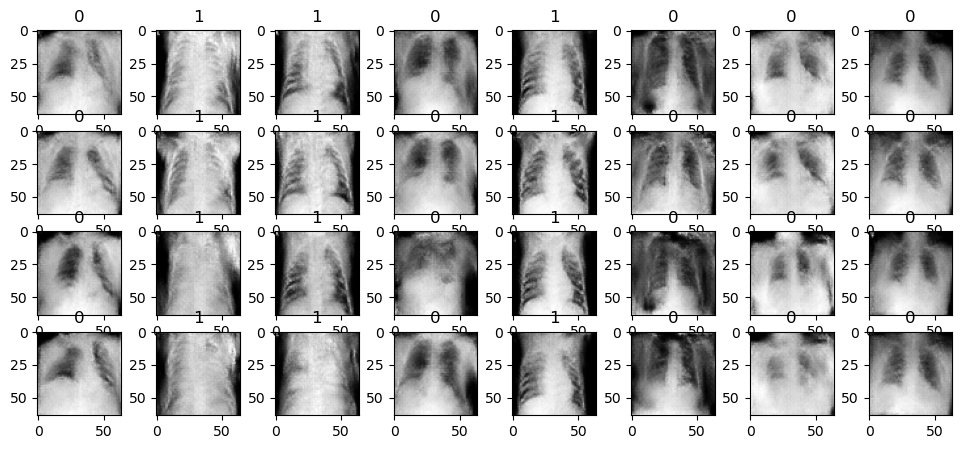

epoch: 24000
discriminator: allloss 1.306570053100586, tagloss 0.06940174102783203, labelloss 1.701075780147221e-05, code_1_loss 0.42629414796829224, code_2_loss 0.5289453864097595, code_3_loss 0.21310068666934967, code_4_loss 0.21768739819526672
generator: allloss 1.9216973781585693, tagloss 1.420093297958374, labelloss 5.723566573578864e-06, code_1_loss 0.12001562118530273, code_2_loss 0.08272756636142731, code_3_loss 0.07217535376548767, code_4_loss 0.061326660215854645


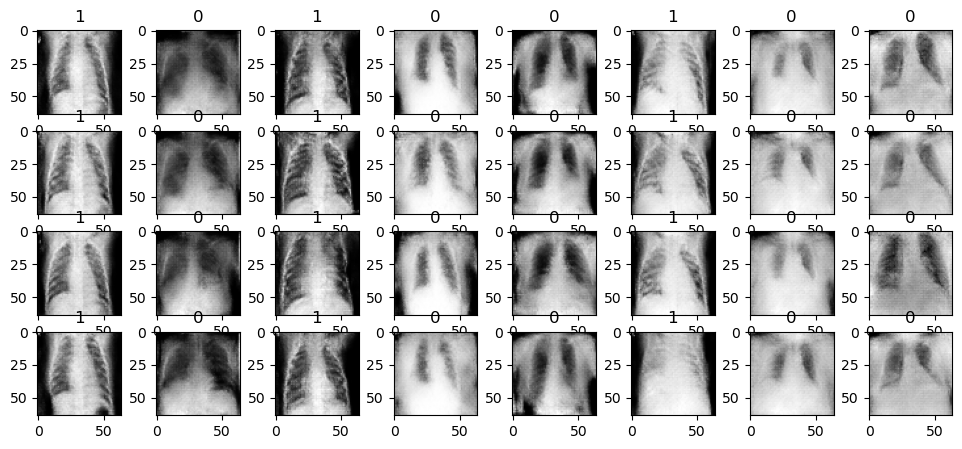

epoch: 25000
discriminator: allloss 1.299599289894104, tagloss 0.10094711929559708, labelloss 1.3706735444429796e-05, code_1_loss 0.4258725345134735, code_2_loss 0.47536423802375793, code_3_loss 0.2154022604227066, code_4_loss 0.2140265703201294
generator: allloss 0.9124869108200073, tagloss 0.3720885217189789, labelloss 8.228726983361412e-06, code_1_loss 0.1485958993434906, code_2_loss 0.08399876952171326, code_3_loss 0.0705607533454895, code_4_loss 0.07671886682510376


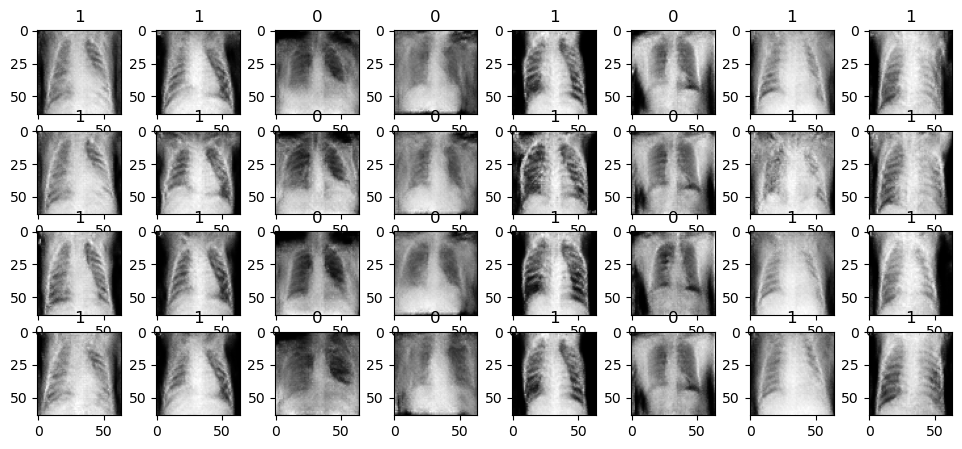

epoch: 26000
discriminator: allloss 1.3269884586334229, tagloss 0.06353502720594406, labelloss 0.0011268033413216472, code_1_loss 0.4405657649040222, code_2_loss 0.5441454648971558, code_3_loss 0.23771686851978302, code_4_loss 0.19534984230995178
generator: allloss 2.2437312602996826, tagloss 1.7753268480300903, labelloss 0.0015619429759681225, code_1_loss 0.11936861276626587, code_2_loss 0.05850788950920105, code_3_loss 0.05306506156921387, code_4_loss 0.05974748730659485


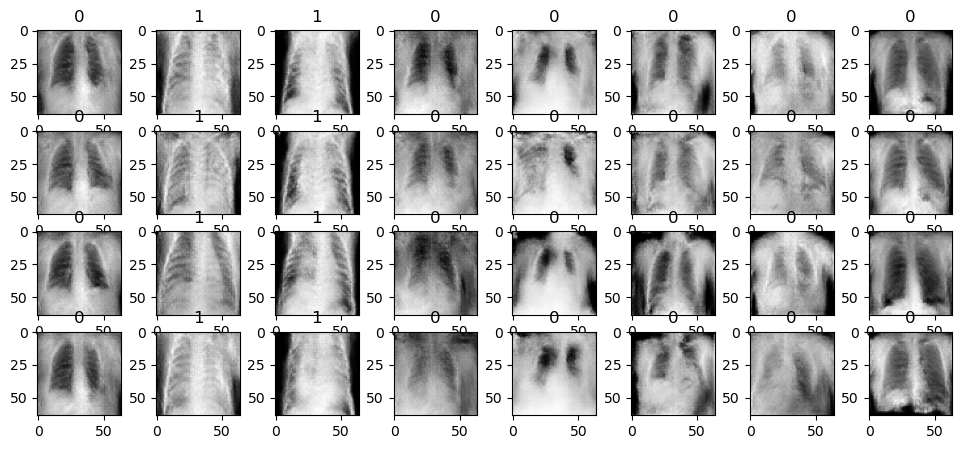

epoch: 27000
discriminator: allloss 1.4182454347610474, tagloss 0.11068302392959595, labelloss 1.761581006576307e-05, code_1_loss 0.43539106845855713, code_2_loss 0.6800349950790405, code_3_loss 0.18820124864578247, code_4_loss 0.17747169733047485
generator: allloss 1.0186843872070312, tagloss 0.4503852128982544, labelloss 8.107925168587826e-06, code_1_loss 0.18441177904605865, code_2_loss 0.09588254988193512, code_3_loss 0.06809954345226288, code_4_loss 0.056623511016368866


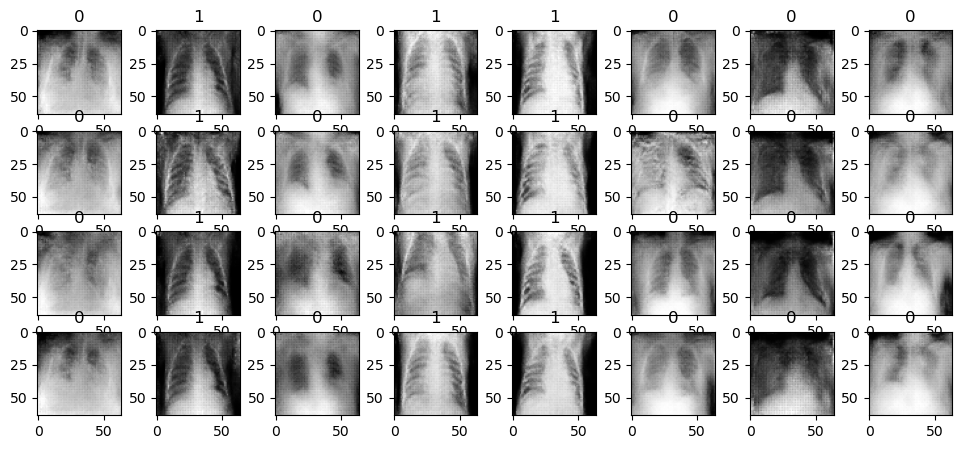

epoch: 28000
discriminator: allloss 1.4153467416763306, tagloss 0.054748401045799255, labelloss 1.1053556590923108e-05, code_1_loss 0.4569436013698578, code_2_loss 0.6776672005653381, code_3_loss 0.21022151410579681, code_4_loss 0.20558276772499084
generator: allloss 1.22609281539917, tagloss 0.7264421582221985, labelloss 4.8007727855292615e-06, code_1_loss 0.14550669491291046, code_2_loss 0.0757032185792923, code_3_loss 0.056118786334991455, code_4_loss 0.04993150383234024


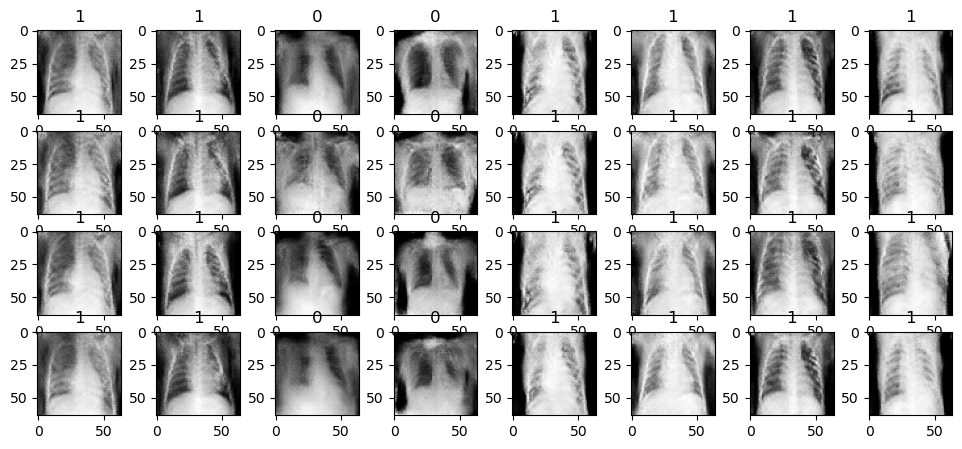

epoch: 29000
discriminator: allloss 1.3463186025619507, tagloss 0.08935925364494324, labelloss 4.990313755115494e-05, code_1_loss 0.38975924253463745, code_2_loss 0.659969687461853, code_3_loss 0.2101103663444519, code_4_loss 0.1743176430463791
generator: allloss 2.439462184906006, tagloss 2.0036261081695557, labelloss 7.857073796913028e-06, code_1_loss 0.09750944375991821, code_2_loss 0.06340226531028748, code_3_loss 0.04280519485473633, code_4_loss 0.0564718022942543


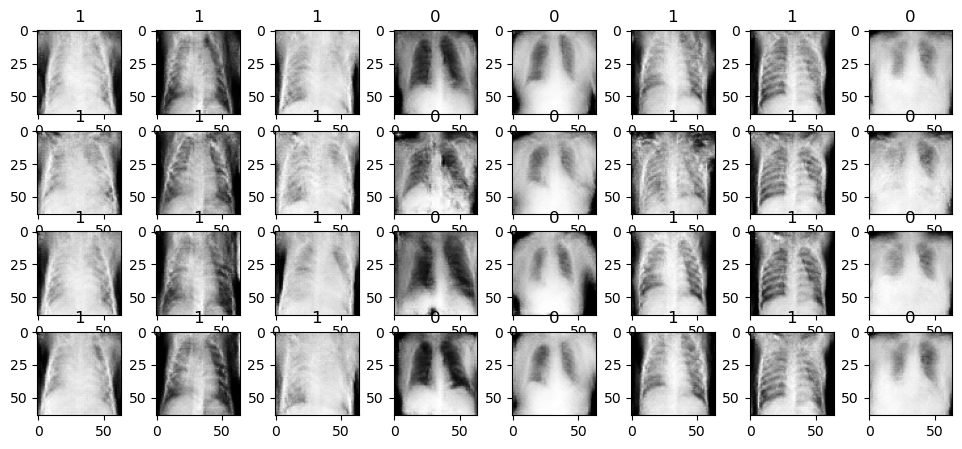

epoch: 30000
discriminator: allloss 1.4167985916137695, tagloss 0.05443788692355156, labelloss 2.1884414309170097e-05, code_1_loss 0.4516911506652832, code_2_loss 0.6858215928077698, code_3_loss 0.21382522583007812, code_4_loss 0.206862211227417
generator: allloss 1.4161409139633179, tagloss 0.9529501795768738, labelloss 3.451338670856785e-06, code_1_loss 0.12144460529088974, code_2_loss 0.06368633359670639, code_3_loss 0.04560254514217377, code_4_loss 0.05941079929471016


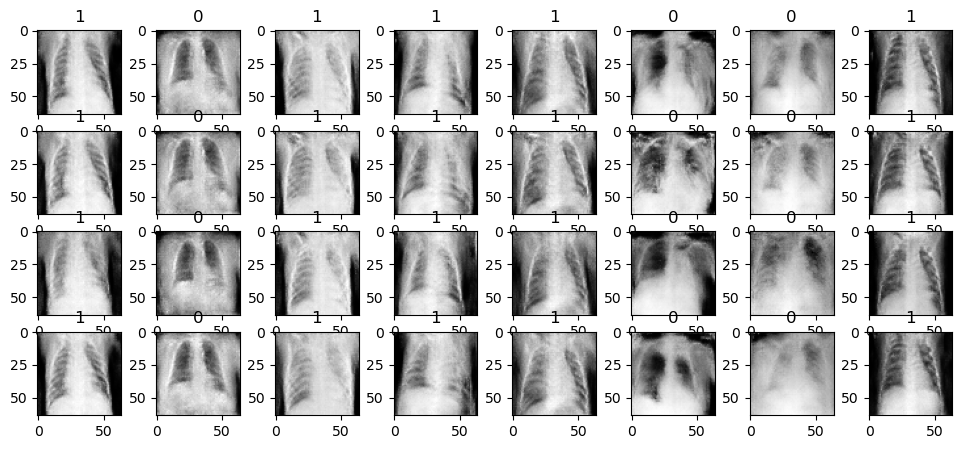

epoch: 31000
discriminator: allloss 1.2406013011932373, tagloss 0.08358319103717804, labelloss 4.3766340240836143e-05, code_1_loss 0.43547412753105164, code_2_loss 0.4342629313468933, code_3_loss 0.20169392228126526, code_4_loss 0.19816353917121887
generator: allloss 1.694322109222412, tagloss 1.2169781923294067, labelloss 3.885212208842859e-06, code_1_loss 0.13084468245506287, code_2_loss 0.07630106806755066, code_3_loss 0.05119842290878296, code_4_loss 0.04632624238729477


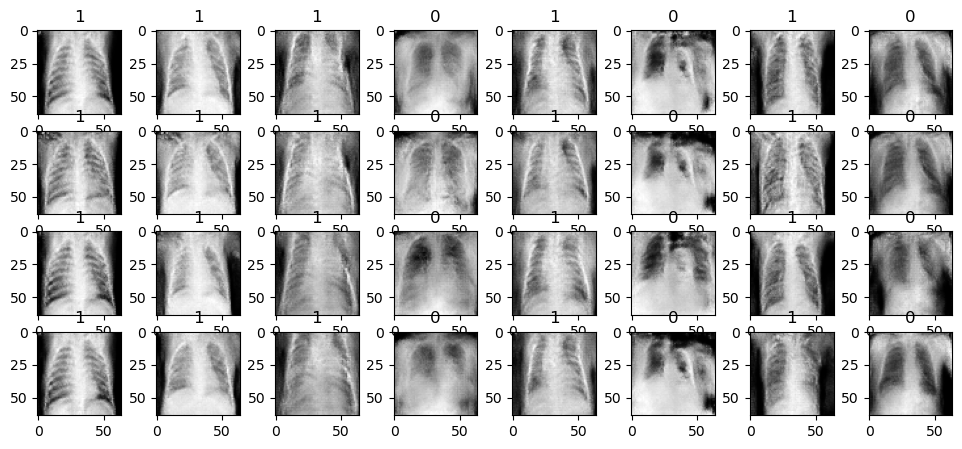

epoch: 32000
discriminator: allloss 1.19437837600708, tagloss 0.050736065953969955, labelloss 2.4661085262778215e-05, code_1_loss 0.402129203081131, code_2_loss 0.4333268105983734, code_3_loss 0.22462168335914612, code_4_loss 0.20878830552101135
generator: allloss 1.503360629081726, tagloss 1.0868420600891113, labelloss 4.3650843508658e-06, code_1_loss 0.09087105840444565, code_2_loss 0.06405588239431381, code_3_loss 0.044307809323072433, code_4_loss 0.040348637849092484


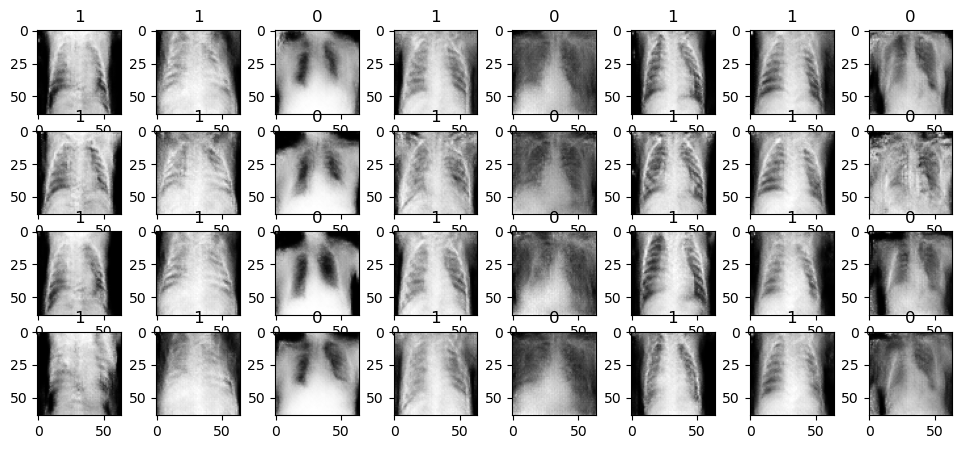

In [16]:
for epoch in range(epochs):
  indexs = np.random.randint(0, len(images), size = (batch, ))
  realImages = images[indexs]
  realTags = tf.ones(shape = (batch, ))
  realLabels = labels[indexs]
  realCode_1 = c1.sample(batch)
  realCode_2 = c2.sample(batch)
  realCode_3 = c3.sample(batch)
  realCode_4 = c3.sample(batch)
  noise = tf.random.uniform(shape = (batch, latent), minval = -1, maxval = 1)
  fakeCode_1 = c1.sample(batch)
  fakeCode_2 = c2.sample(batch)
  fakeCode_3 = c3.sample(batch)
  fakeCode_4 = c3.sample(batch)
  fakeLabels = tf.keras.utils.to_categorical(
      np.random.choice(range(labelInput), size = (batch, )), num_classes = labelInput
  )
  fakeTags = tf.zeros(shape = (batch, ))
  fakeImages = tf.squeeze(generator.predict([noise, fakeLabels, 
                                             fakeCode_1, fakeCode_2,
                                             fakeCode_3, fakeCode_4], verbose = 0))
  allImages = np.vstack([realImages, fakeImages])
  allTags = np.hstack([realTags, fakeTags])
  allLabels = np.vstack([realLabels, fakeLabels])
  allCode_1 = np.concatenate([realCode_1, fakeCode_1])
  allCode_2 = np.concatenate([realCode_2, fakeCode_2])
  allCode_3 = np.concatenate([realCode_3, fakeCode_3])
  allCode_4 = np.concatenate([realCode_4, fakeCode_4])
  allloss, tagloss, labelloss, code_1_loss, code_2_loss, code_3_loss, code_4_loss = discriminator.train_on_batch(
      [allImages], [allTags, allLabels, allCode_1, allCode_2, allCode_3, allCode_4]
  )
  as_real = tf.ones(shape = (batch, ))
  noise = tf.random.uniform(shape = (batch, latent), minval = -1, maxval = 1)
  fakeCode_1 = c1.sample(batch)
  fakeCode_2 = c2.sample(batch)
  fakeCode_3 = c3.sample(batch)
  fakeCode_4 = c3.sample(batch)
  fakeLabels = tf.keras.utils.to_categorical(
      np.random.choice(range(labelInput), size = (batch, )), num_classes = labelInput
  )
  gloss, gtagloss, glabelsloss, gcode_1_loss, gcode_2_loss, gcode_3_loss, gcode_4_loss = gan.train_on_batch(
      [noise, fakeLabels, fakeCode_1, fakeCode_2, fakeCode_3, fakeCode_4], 
      [as_real, fakeLabels, fakeCode_1, fakeCode_2, fakeCode_3, fakeCode_4]
  )
  if epoch %1000 == 0:
    print('epoch: {}'.format(epoch))
    print('discriminator: allloss {}, tagloss {}, labelloss {}, code_1_loss {}, code_2_loss {}, code_3_loss {}, code_4_loss {}'.format(
        allloss, tagloss, labelloss, code_1_loss, code_2_loss, code_3_loss, code_4_loss
    ))
    print('generator: allloss {}, tagloss {}, labelloss {}, code_1_loss {}, code_2_loss {}, code_3_loss {}, code_4_loss {}'.format(
        gloss, gtagloss, glabelsloss, gcode_1_loss, gcode_2_loss, gcode_3_loss, gcode_4_loss
    ))
    show_sample(generator, batch = 8, c1 = c1, c2 = c2, c3 = c3, c4 = c3)

In [19]:
def show_samples(images, info):
    plt.figure(figsize = (13, 11))
    for i in range(64):
        plt.subplot(8, 8, (i + 1))
        plt.imshow(images[i], cmap = 'gray')
        plt.title(info[i])
    plt.show()

**Reviewing changes in medical images when taking different samples from the probability distribution**

In [20]:
batch = 64
noise = tf.random.uniform(shape = (batch, latent), minval = -1, maxval = 1)
fakeLabels = tf.keras.utils.to_categorical(
  np.random.choice([0], size = (batch, )), num_classes = labelInput
)

**The same noise vector will be used, but each time we will pass different generation attributes, and we will see the changes in the medical images each time.**

/opt/conda/lib/python3.10/site-packages/matplotlib/text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


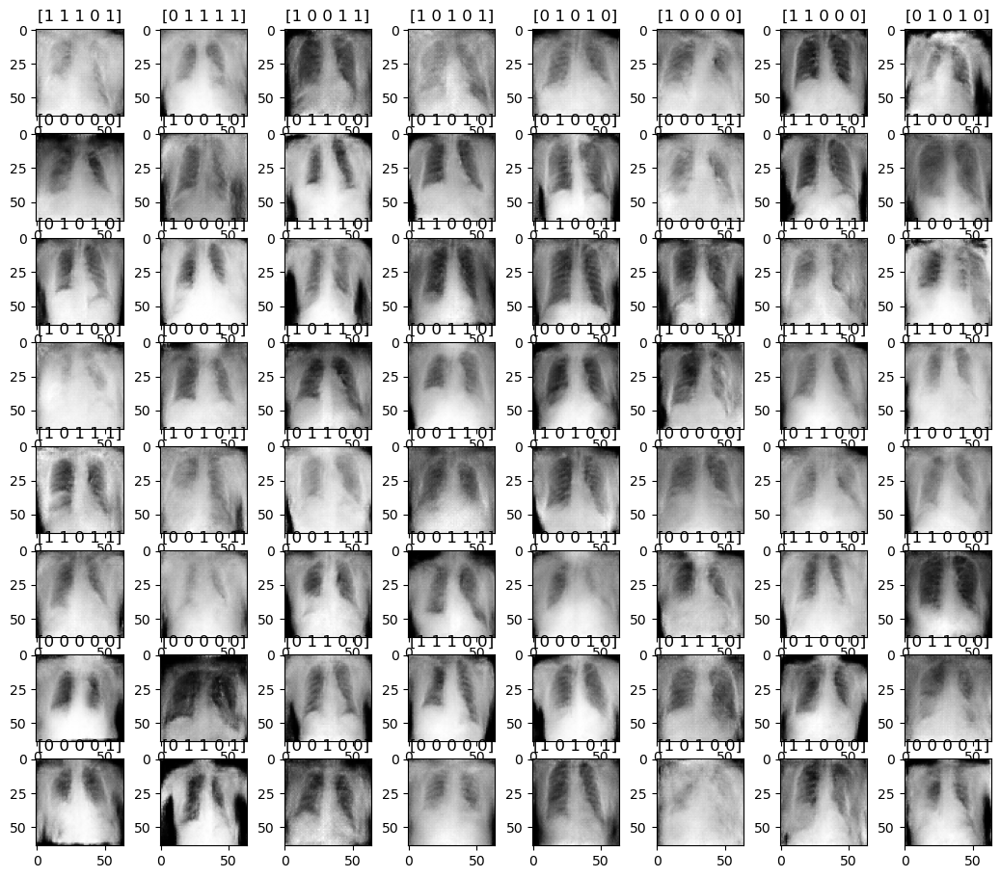

In [21]:
fakeLabels = tf.keras.utils.to_categorical(
  np.random.choice([0], size = (batch, )), num_classes = labelInput
)
con_ = c1.sample(batch)
imagesGenerator = tf.squeeze(generator.predict([noise, fakeLabels,
                                     con_,
                                     tf.zeros(shape = (batch, latent_con)),
                                     tf.zeros(shape = (batch, latent_con)),
                                     tf.zeros(shape = (batch, latent_con))], verbose = 0))
show_samples(imagesGenerator, con_.numpy())

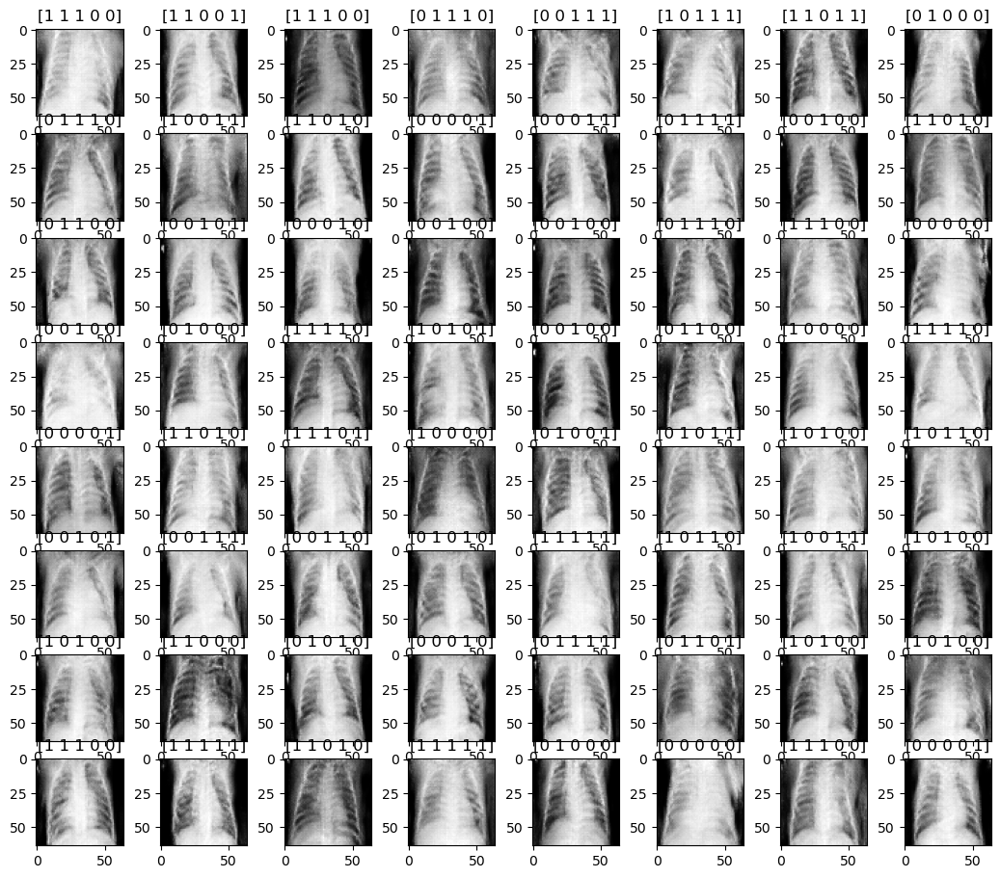

In [22]:
fakeLabels = tf.keras.utils.to_categorical(
  np.random.choice([1], size = (batch, )), num_classes = labelInput
)
con_ = c1.sample(batch)
imagesGenerator = tf.squeeze(generator.predict([noise, fakeLabels,
                                     con_,
                                     tf.zeros(shape = (batch, latent_con)),
                                     tf.zeros(shape = (batch, latent_con)),
                                     tf.zeros(shape = (batch, latent_con))], verbose = 0))
show_samples(imagesGenerator, con_.numpy())

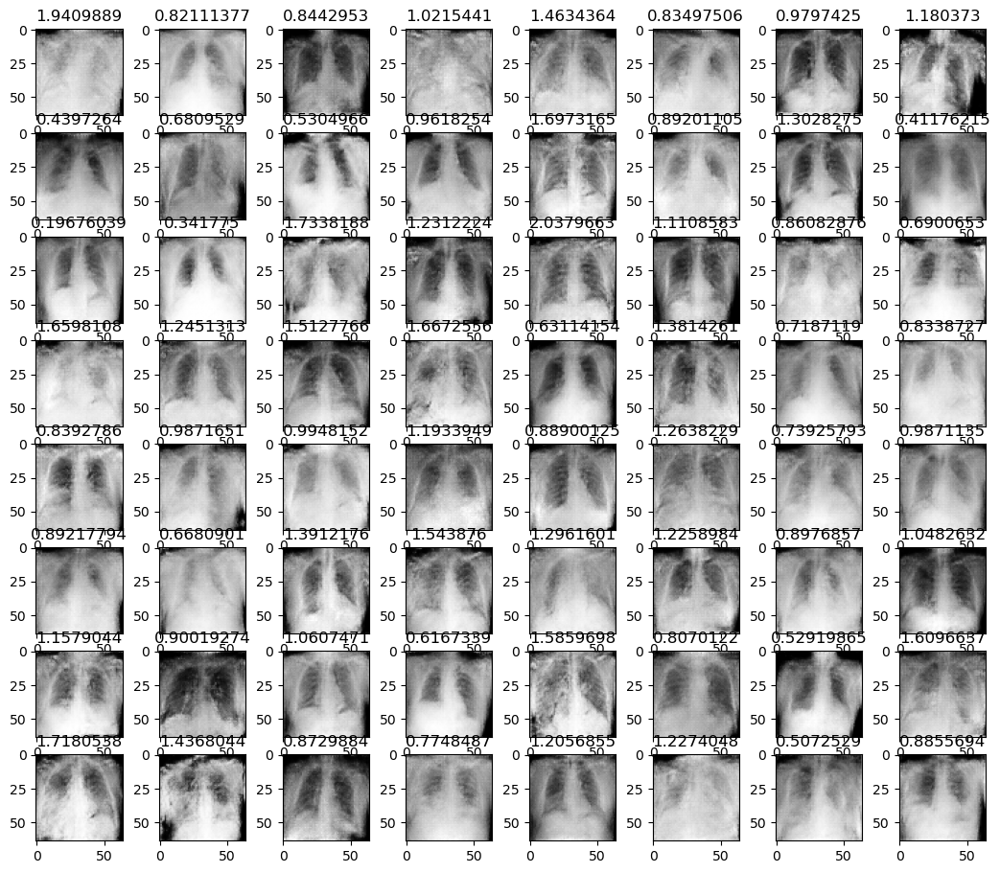

In [23]:
fakeLabels = tf.keras.utils.to_categorical(
  np.random.choice([0], size = (batch, )), num_classes = labelInput
)
con_ = c2.sample(batch)
average = np.average(con_, axis = 1)
imagesGenerator = tf.squeeze(generator.predict([noise, fakeLabels,
                                     tf.zeros(shape = (batch, latent_con)),
                                     con_,
                                     tf.zeros(shape = (batch, latent_con)),
                                     tf.zeros(shape = (batch, latent_con))], verbose = 0))
show_samples(imagesGenerator, average)

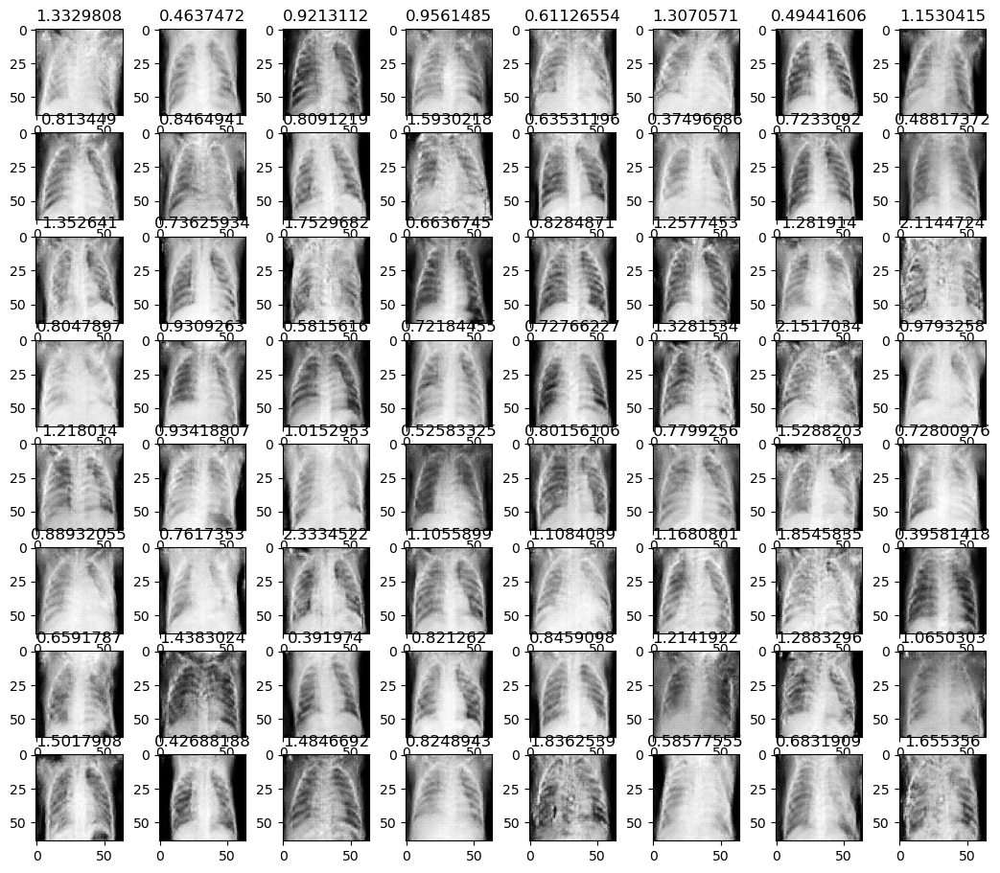

In [24]:
fakeLabels = tf.keras.utils.to_categorical(
  np.random.choice([1], size = (batch, )), num_classes = labelInput
)
con_ = c2.sample(batch)
average = np.average(con_, axis = 1)
imagesGenerator = tf.squeeze(generator.predict([noise, fakeLabels,
                                     tf.zeros(shape = (batch, latent_con)),
                                     con_,
                                     tf.zeros(shape = (batch, latent_con)),
                                     tf.zeros(shape = (batch, latent_con))], verbose = 0))
show_samples(imagesGenerator, average)

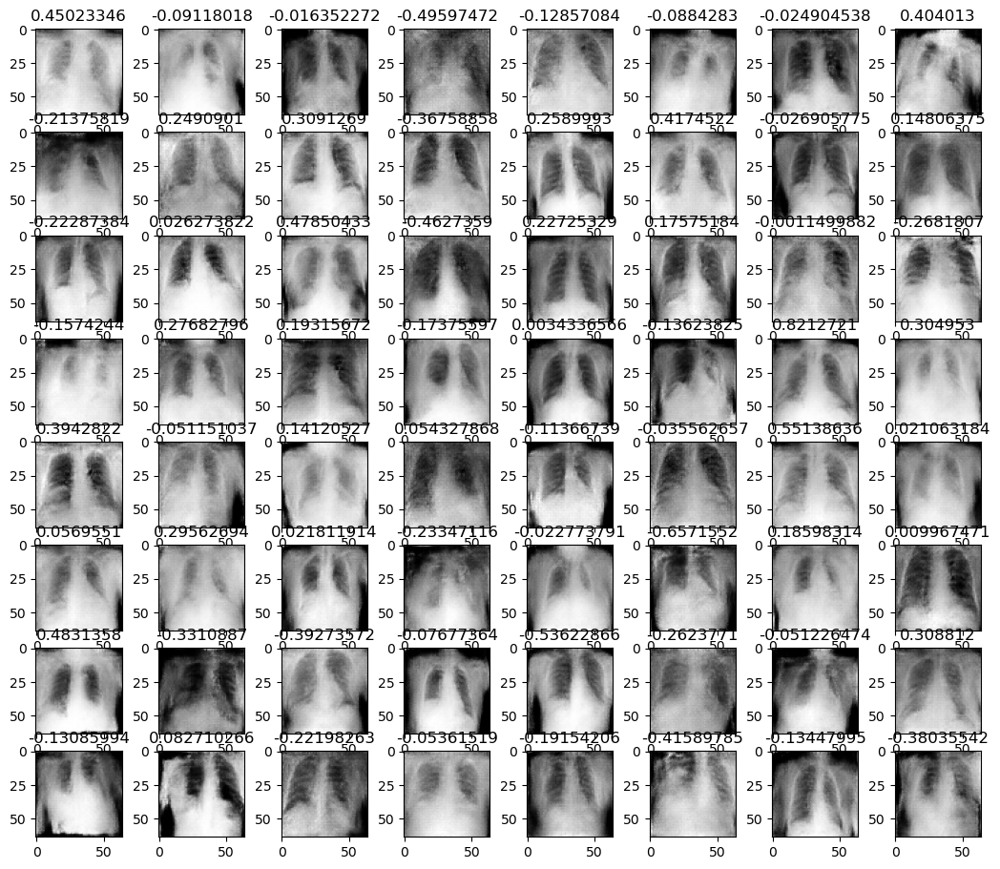

In [25]:
fakeLabels = tf.keras.utils.to_categorical(
  np.random.choice([0], size = (batch, )), num_classes = labelInput
)
con_ = c3.sample(batch)
average = np.average(con_, axis = 1)
imagesGenerator = tf.squeeze(generator.predict([noise, fakeLabels,
                                     tf.zeros(shape = (batch, latent_con)),
                                     tf.zeros(shape = (batch, latent_con)),
                                     con_,
                                     tf.zeros(shape = (batch, latent_con))], verbose = 0))
show_samples(imagesGenerator, average)

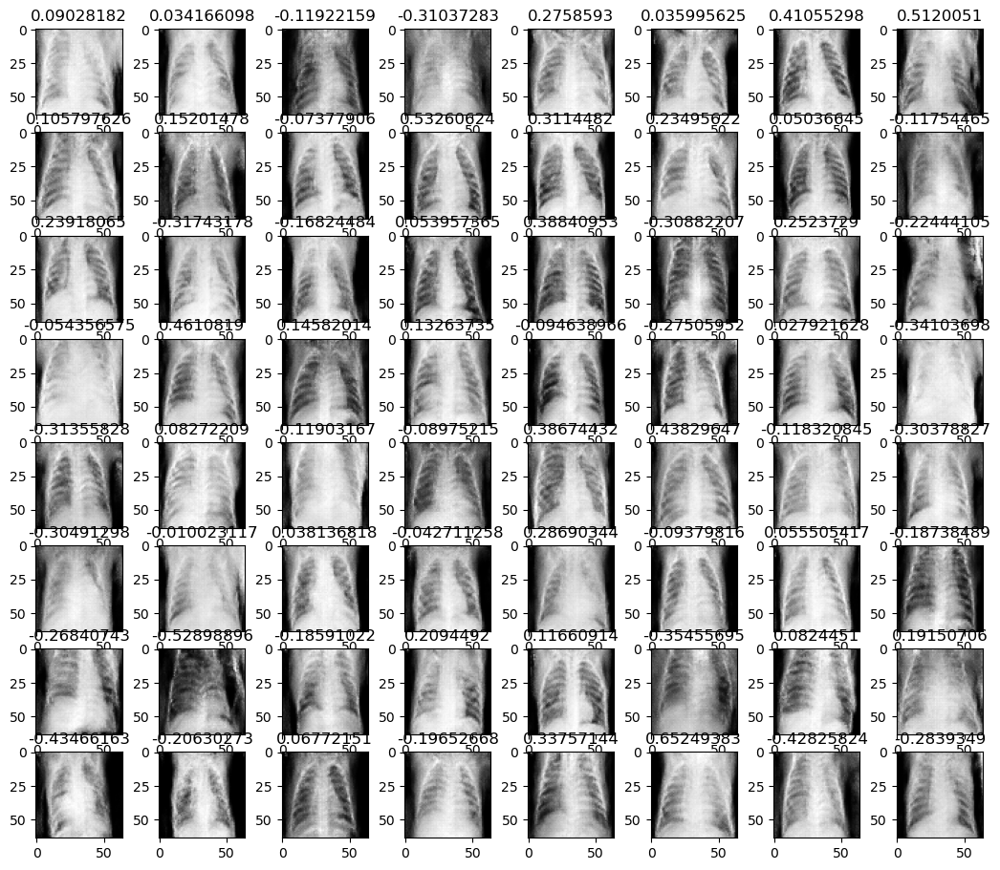

In [26]:
fakeLabels = tf.keras.utils.to_categorical(
  np.random.choice([1], size = (batch, )), num_classes = labelInput
)
con_ = c3.sample(batch)
average = np.average(con_, axis = 1)
imagesGenerator = tf.squeeze(generator.predict([noise, fakeLabels,
                                     tf.zeros(shape = (batch, latent_con)),
                                     tf.zeros(shape = (batch, latent_con)),
                                     con_,
                                     tf.zeros(shape = (batch, latent_con))], verbose = 0))
show_samples(imagesGenerator, average)

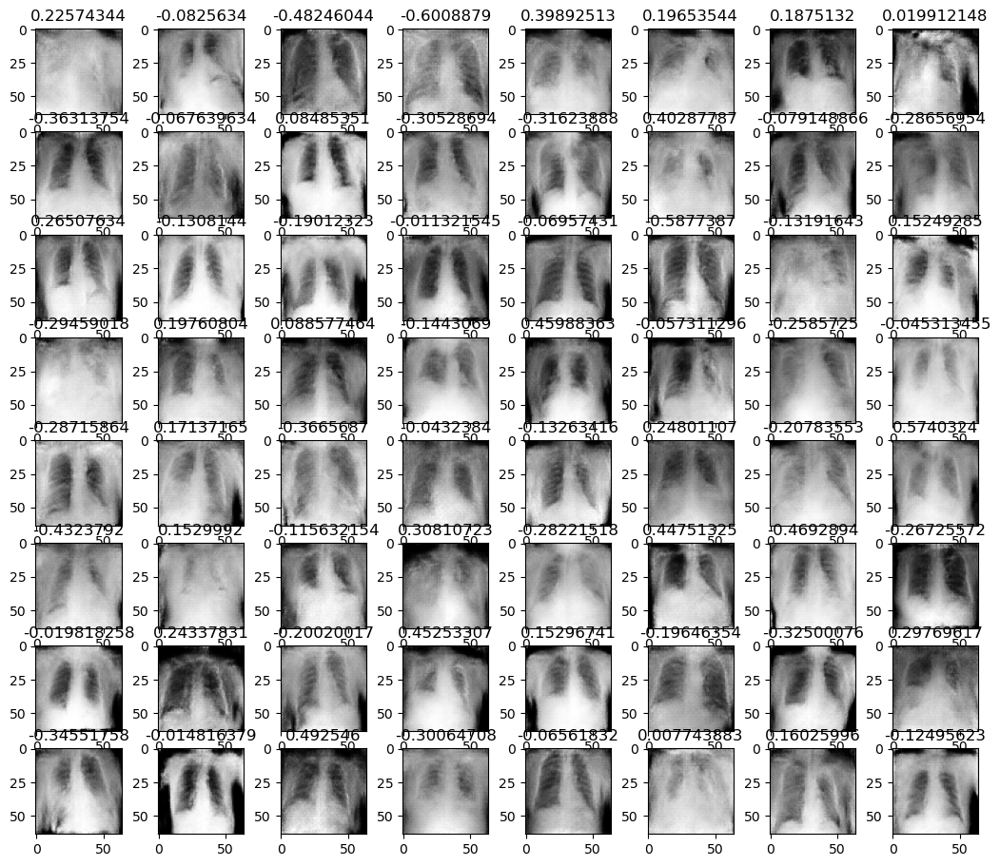

In [27]:
fakeLabels = tf.keras.utils.to_categorical(
  np.random.choice([0], size = (batch, )), num_classes = labelInput
)
con_ = c3.sample(batch)
average = np.average(con_, axis = 1)
imagesGenerator = tf.squeeze(generator.predict([noise, fakeLabels,
                                     tf.zeros(shape = (batch, latent_con)),
                                     tf.zeros(shape = (batch, latent_con)),
                                     tf.zeros(shape = (batch, latent_con)),
                                     con_], verbose = 0))
show_samples(imagesGenerator, average)

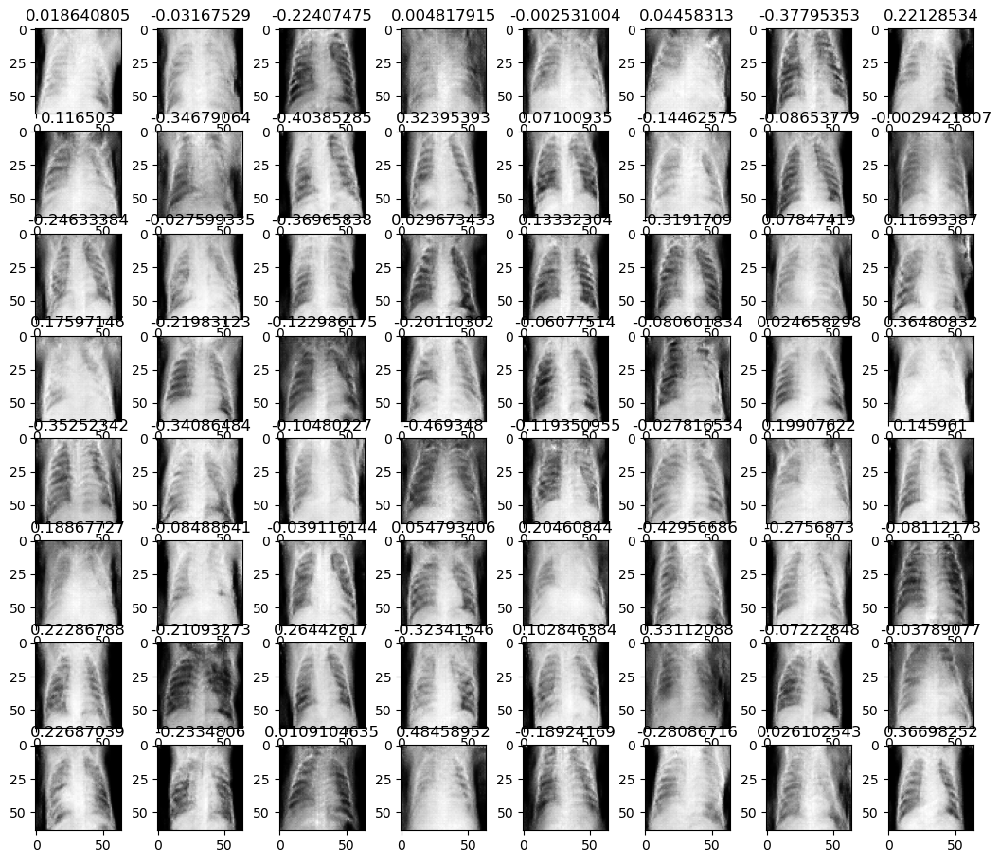

In [28]:
fakeLabels = tf.keras.utils.to_categorical(
  np.random.choice([1], size = (batch, )), num_classes = labelInput
)
con_ = c3.sample(batch)
average = np.average(con_, axis = 1)
imagesGenerator = tf.squeeze(generator.predict([noise, fakeLabels,
                                     tf.zeros(shape = (batch, latent_con)),
                                     tf.zeros(shape = (batch, latent_con)),
                                     tf.zeros(shape = (batch, latent_con)),
                                     con_], verbose = 0))
show_samples(imagesGenerator, average)

# Model(Generator) Accuracy Test:
In order to test the accuracy of the model, a neural network was built and a large number of images with different features were generated, and the convolutional neural network was trained on those images. Later, the trained neural network is tested on the images included in the original dataset, and we will see the accuracy of the classification and the only measures.

In [10]:
batch = 5000
noise = tf.random.uniform(shape = (batch, latent), minval = -1, maxval = 1)
fakeLabels = tf.keras.utils.to_categorical(
  np.random.choice([0, 1], size = (batch, )), num_classes = labelInput
)
con_ = c2.sample(batch)
imagesGenerator1 = tf.squeeze(generator.predict([noise, fakeLabels,
                                     c1.sample(batch),
                                     tf.zeros(shape = (batch, latent_con)),
                                     tf.zeros(shape = (batch, latent_con)),
                                     tf.zeros(shape = (batch, latent_con))], verbose = 0))
imagesGenerator2 = tf.squeeze(generator.predict([noise, fakeLabels,
                                     tf.zeros(shape = (batch, latent_con)),
                                     c2.sample(batch),
                                     tf.zeros(shape = (batch, latent_con)),
                                     tf.zeros(shape = (batch, latent_con))], verbose = 0))
imagesGenerator3 = tf.squeeze(generator.predict([noise, fakeLabels,
                                     tf.zeros(shape = (batch, latent_con)),
                                     tf.zeros(shape = (batch, latent_con)),
                                     c3.sample(batch),
                                     tf.zeros(shape = (batch, latent_con))], verbose = 0))
imagesGenerator4 = tf.squeeze(generator.predict([noise, fakeLabels,
                                     tf.zeros(shape = (batch, latent_con)),
                                     tf.zeros(shape = (batch, latent_con)),
                                     tf.zeros(shape = (batch, latent_con)),
                                     c3.sample(batch)], verbose = 0))
imagesGenerator = np.vstack([imagesGenerator1, 
                             imagesGenerator2,
                             imagesGenerator3,
                             imagesGenerator4])
labelsGenerator = np.vstack([fakeLabels, fakeLabels, fakeLabels, fakeLabels])
imagesGenerator.shape, labelsGenerator.shape

((20000, 64, 64), (20000, 2))

In [11]:
from keras.applications import VGG16
from keras.metrics import Accuracy, Precision, Recall
basemodel = VGG16(weights = None, include_top = None, 
                 input_shape = (64, 64, 1), pooling = 'avg')
x = layers.Dropout(0.5)(basemodel.output)
x = layers.BatchNormalization()(x)
x = layers.Dense(128, activation = 'LeakyReLU')(x)
x = layers.BatchNormalization()(x)
x = layers.Dropout(0.5)(x)
x = layers.Dense(32, activation = 'LeakyReLU')(x)
x = layers.BatchNormalization()(x)
x = layers.Dropout(0.5)(x)
x = layers.Dense(2, activation = 'softmax')(x)
m = models.Model(inputs = basemodel.input, outputs = x)
m.compile(loss = 'binary_crossentropy', 
          optimizer = tf.keras.optimizers.Adam(learning_rate = 0.00001),
          metrics = ['accuracy', Precision(name = 'precision'), Recall(name = 'recall')])
m.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 64, 64, 1)]       0         
                                                                 
 block1_conv1 (Conv2D)       (None, 64, 64, 64)        640       
                                                                 
 block1_conv2 (Conv2D)       (None, 64, 64, 64)        36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 32, 32, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 32, 32, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 32, 32, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 16, 16, 128)       0     

In [12]:
history = m.fit(imagesGenerator, labelsGenerator, epochs = 60, batch_size = 32, 
                validation_split = 0.3,
                callbacks = [tf.keras.callbacks.EarlyStopping(monitor = 'val_loss', 
                                                   mode = 'min', patience = 3, 
                                                   restore_best_weights = True)])

Epoch 1/60
438/438 [==============================] - 25s 37ms/step - loss: 0.3581 - accuracy: 0.9285 - precision: 0.9285 - recall: 0.9285 - val_loss: 0.6245 - val_accuracy: 0.7677 - val_precision: 0.7677 - val_recall: 0.7677
Epoch 2/60
438/438 [==============================] - 15s 35ms/step - loss: 0.1705 - accuracy: 0.9956 - precision: 0.9956 - recall: 0.9956 - val_loss: 0.0864 - val_accuracy: 0.9922 - val_precision: 0.9922 - val_recall: 0.9922
Epoch 3/60
438/438 [==============================] - 15s 34ms/step - loss: 0.1415 - accuracy: 0.9974 - precision: 0.9974 - recall: 0.9974 - val_loss: 0.0402 - val_accuracy: 0.9990 - val_precision: 0.9990 - val_recall: 0.9990
Epoch 4/60
438/438 [==============================] - 15s 35ms/step - loss: 0.1223 - accuracy: 0.9992 - precision: 0.9992 - recall: 0.9992 - val_loss: 0.0421 - val_accuracy: 0.9988 - val_precision: 0.9988 - val_recall: 0.9988
Epoch 5/60
438/438 [==============================] - 14s 32ms/step - loss: 0.1087 - accuracy: 0

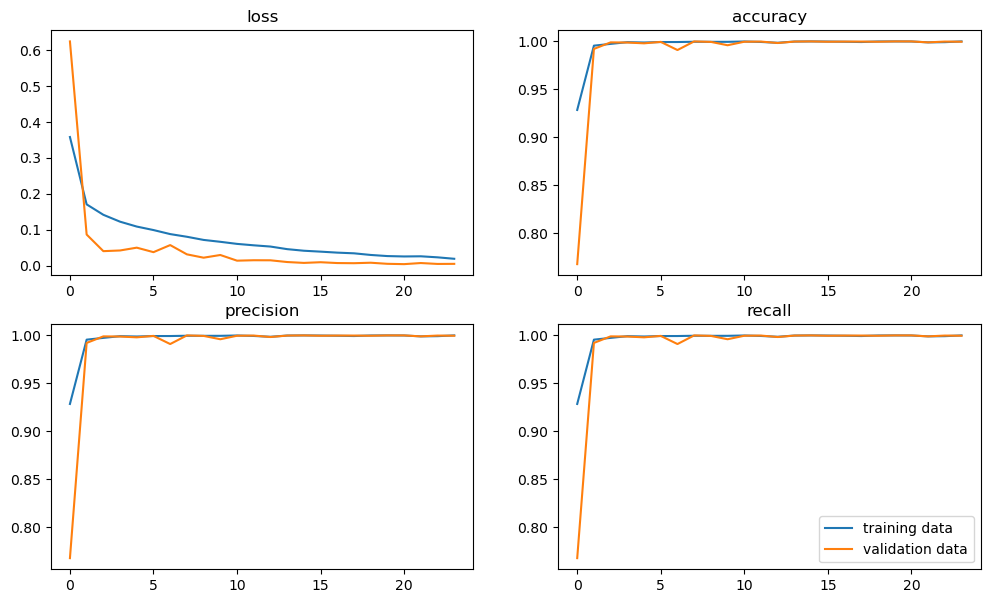

In [13]:
metrics = ['loss', 'accuracy', 'precision', 'recall']
plt.figure(figsize = (12, 7))
for i in range(4):
    plt.subplot(2, 2, (i + 1))
    plt.title(metrics[i])
    plt.plot(history.history[metrics[i]], label = 'training data')
    plt.plot(history.history['val_{}'.format(metrics[i])], label = 'validation data')
plt.legend()

> **Evaluation of the performance of the model in dealing with the basic images included in the dataset.**

In [21]:
images.shape, labels.shape

((2680, 64, 64), (2680, 2))

In [22]:
m.evaluate(images, labels)

84/84 [==============================] - 1s 10ms/step - loss: 0.0733 - accuracy: 0.9799 - precision: 0.9799 - recall: 0.9799


[0.07325693964958191,
 0.9798507690429688,
 0.9798507690429688,
 0.9798507690429688]

In [23]:
y_pred = m.predict(images)
y_pred = np.argmax(y_pred, axis = 1)
y_true = np.argmax(labels, axis = 1)

84/84 [==============================] - 1s 8ms/step


In [24]:
print(classification_report(y_true, y_pred))

              precision    recall  f1-score   support

           0       0.98      0.98      0.98      1340
           1       0.98      0.98      0.98      1340

    accuracy                           0.98      2680
   macro avg       0.98      0.98      0.98      2680
weighted avg       0.98      0.98      0.98      2680



In [25]:
cm = confusion_matrix(y_true, y_pred)
cm = pd.DataFrame(cm, columns = ['Covid-19', 'Viral Pneumonia'], 
                  index = ['Covid-19', 'Viral Pneumonia'])
cm.head(n = 4)

,Covid-19,Viral Pneumonia
Covid-19,1315,25
Viral Pneumonia,29,1311


In [26]:
precision_score(y_true, y_pred), recall_score(y_true, y_pred)

(0.9812874251497006, 0.9783582089552239)

<Axes: >

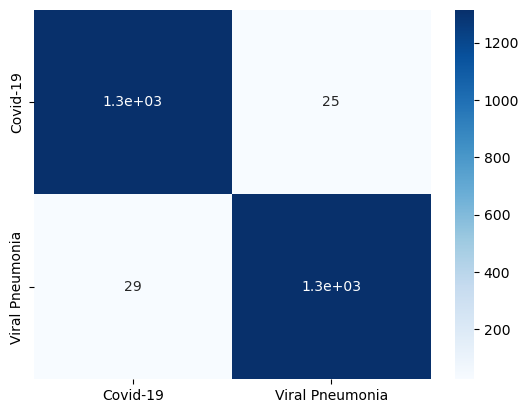

In [27]:
sns.heatmap(cm, annot = True, cmap = 'Blues')